## Εργαστηριακή Άσκηση 3. Βαθιά Μάθηση
### Ημερομηνία εκφώνησης της άσκησης: 6 Ιανουαρίου 2022


# **Intro: Image Captioning**

## Θέμα της 3ης εργασίας του μαθήματος είναι η Βαθιά Μάθηση. Θα μελετήσουμε ένα πρόβλημα που συνδυάζει Όραση Υπολογιστών και Επεξεργασία Φυσικής Γλώσσας. Συγκεκριμένα, θα φτιάξουμε ένα νευρωνικό δίκτυο παραγωγής λεκτικών περιγραφών από εικόνες (Image Captioning).

## Τα ευρύτερα χρησιμοποιούμενα datasets στο Image Captioning είναι τα Flickr8k, Flickr30k, και το COCO. Το παράδειγμα του TensorFlow χρησιμοποιεί το COCO. Εμείς θα χρησιμοποιήσουμε το "flickr30k-images-ecemod", μια παραλλαγή του flick30k για την παρούσα εργασία μας.

## Τα δεδομένα του flickr30k-images-ecemod είναι τα εξής:

*     ένας φάκελος "image_dir" με 31.783 εικόνες από το Flickr
*     ένα αρχείο "train_captions.csv" με 148.915 captions για τις εικόνες του "image_dir". Kάθε εικόνα έχει συνήθως από 3-5 διαφορετικά captions.
*     ένα αρχείο "test_images.csv" με 2.000 ονόματα εικόνων που βρίσκονται στο "image_dir" και δεν έχουν captions εκπαίδευσης.

In [ ]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import os
import pathlib
import pandas as pd
import json
from PIL import Image
import time

print("Έκδοση Tensorflow: " + tf.__version__)

Έκδοση Tensorflow: 2.6.2


In [ ]:
!pip install gdown
import gdown 

  Installing build dependencies ... - \ | / done
  Getting requirements to build wheel ... - \ | done
  Preparing metadata (pyproject.toml) ... - \ | done
  Created wheel for gdown: filename=gdown-4.4.0-py3-none-any.whl size=14775 sha256=c0f376e5fbcbabd777354deffee77b934bc094ab6a14bda0730937605491d878
  Stored in directory: /root/.cache/pip/wheels/fb/c3/0e/c4d8ff8bfcb0461afff199471449f642179b74968c15b7a69c
Successfully built gdown


## Παρακάτω εισάγουμε δεδομένα του flickr30k-images-ecemod " μέσω του dataset αφού προηγουμένως το συγκεκριμένο αρχείο το ανεβάσαμε στο dataset στο kaggle. Έτσι το output directory μας παραμένει άδειο καθώς το dataset βρισκεται στο input directory. Συνεπώς τα παρακάτω 5 κελιά τα οποία χρησιμεύουν ώστε να γίνει import το dataset από το drive μας μπαίνουν σε comment. Μπορούν ωστόσο να χρησιμοποιηθούν αν κάποιος το επιθυμεί. Aυτό χρησιμεύει αρκετά στο περιβάλλον του kaggle καθώς ο διαθέσιμος χώρος είναι αρκετά περιορισμένος και με την εισαγωγή του dataset με απευθείας download από τα παρακάτω κελιά περιορίζει ακόμα περισσότερο το διαθέσιμο χώρο.

In [ ]:
# Download from drive

# url = 'https://drive.google.com/uc?id=1uIMgd15q4IflEIjEVGzT4fAQUSfJn5JQ'
# output = 'flickr30k-images-ecemod.zip' 
# gdown.download(url, output, quiet=False, fuzzy=True) 

In [ ]:
# Unzip the images

# import zipfile
# with zipfile.ZipFile('./flickr30k-images-ecemod.zip', 'r') as zip_ref:
#    zip_ref.extractall('./')

In [ ]:
# Delete the zip files after extraction

# files_to_delete = './*.zip' # this considers only ".zip" files. If you want to delete all files, use "./*"
# files_list = pathlib.Path(os.getcwd()).glob(files_to_delete)
# for file_path in files_list:
#     os.remove(file_path)

In [ ]:
# Download train captions file directly from spartacus, here we do not use gdown since the file is small and download time is reduced

#train_captions_file = tf.keras.utils.get_file('train_captions.csv',
#                                           cache_subdir=os.path.abspath('.'),
#                                           origin='https://spartacus.1337.cx/flickr-mod/train_captions.csv',
#                                           extract=False)

In [ ]:
# Download test images file directly from spartacus, here we do not use gdown since the file is small and download time is reduced

#test_images_file = tf.keras.utils.get_file('test_images.csv',
#                                           cache_subdir=os.path.abspath('.'),
#                                           origin='https://spartacus.1337.cx/flickr-mod/test_images.csv',
#                                           extract=False)

## Oρισμός των PATHS όπου βρίσκονται τα αντίστοιχα αρχεία.

In [ ]:
# Image paths
PATH_TO_IMAGES = '../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir'
# Train Captions paths
PATH_TO_TRAIN_CAPTIONS = '../input/flickecemod/train_captions.csv'
# Test Images paths
PATH_TO_TEST_IMAGES = '../input/flickecemod/test_images.csv'

In [ ]:
# Show number of images contained in the dataset

items = os.listdir(PATH_TO_IMAGES)
print(len(items))

31784


In [ ]:
# Obtain captions to be used in the training 

original_train_captions = pd.read_csv(PATH_TO_TRAIN_CAPTIONS, on_bad_lines='skip', sep='|')

In [ ]:
# Obtain images to be used in our testings and our participation in ECE Image Captioning Competition

original_test_images = pd.read_csv(PATH_TO_TEST_IMAGES, on_bad_lines='skip', sep='|')

In [ ]:
# Since header of the train_captions csv contains an actual image name we also collect that

header_image_name = list(original_train_captions.head(0))[0]
print(f"First image belonging to the header of the train_captions.csv is {header_image_name}")

First image belonging to the header of the train_captions.csv is _1000070808.jpg


In [ ]:
# Since header of the train_captions csv contains an actual caption for the image belonging in the header we also collect that

header_caption_name = list(original_train_captions.head(0))[2]
print(f"First caption for the first image belonging to the header of the train_captions.csv is \n '{header_caption_name}'")

First caption for the first image belonging to the header of the train_captions.csv is 
 ' A little girl holds orange lilies while others celebrate an occasion in a garden setting .'


In [ ]:
# Just to view our train data of captions, we can see that for 31784 images we have 148914 captions. As seen every image contains about 5 different captions.

original_train_captions[0:len(original_train_captions)]

,_1000070808.jpg,0,A little girl holds orange lilies while others celebrate an occasion in a garden setting .
0,_1000070808.jpg,1,A little girl at a wedding holds a bouquet of...
1,_1000070808.jpg,2,Young girl in orange dress holding orange flo...
2,_1000070808.jpg,3,a girl at a wedding holding some orange flowers
3,_1000070808.jpg,4,A girl holds a bouquet of flowers
4,_100007487.jpg,0,A young child walks down a gravel path lined ...
...,...,...,...
148909,_99999606.jpg,0,A man in a gray shirt sits with several pairs...
148910,_99999606.jpg,1,A man is sitting down and he is surrounded by...
148911,_99999606.jpg,2,Older man with shoes in front and behind him .
148912,_99999606.jpg,3,This man has worked here for many decades .


In [ ]:
# Just to view our test images. These images don't have any captions available. As seen below there are 2.000 test images.

original_test_images

,_1000400860.jpg
0,_100046208.jpg
1,_1000933460.jpg
2,_1003969002.jpg
3,_10042424.jpg
4,_100654872.jpg
...,...
1994,_994748436.jpg
1995,_99541900.jpg
1996,_997103085.jpg
1997,_99794568.jpg


## Παρατηρούμε πως τα test images είναι απλά εικόνες χωρίς captions. Ως συνέπεια παρακάτω θα χωρίσουμε το αρχικό σετ σε train set και validation set ώστε να έχουμε μια αξιολόγηση του μοντέλου μας. Παράλληλα θα χρησιμοποιήσουμε τις εικονες του test set ώστε να δημιουργήσουμε το κατάλληλο αρχείο answer.txt για να το υποβάλλουμε στον τρέχοντα διαγωνισμό.

In [ ]:
# Gather in image_names all the image names
image_names = original_train_captions.iloc[:, 0].tolist()
# Insert at the start the info we extracted from the header
image_names.insert(0, header_image_name)
print(f"First training image name is: {image_names[0]}")

First training image name is: _1000070808.jpg


In [ ]:
# Gather in test_images  all the test image names
test_images = original_test_images.iloc[:, 0].tolist()
# Insert at the start the info we extracted from the header
test_images.insert(0, list(original_train_captions.head(0))[0])

In [ ]:
# Insert in image_names the full path to each image
for i in range(len(image_names)):
    image_names[i] = PATH_TO_IMAGES + "/{}".format(image_names[i])

In [ ]:
len(image_names)

148915

In [ ]:
image_names[1]

'../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_1000070808.jpg'

In [ ]:
#insert in test_images the full path to each image
for i in range(len(test_images)):
    test_images[i] = PATH_TO_IMAGES + "/{}".format(test_images[i])

In [ ]:
test_images[1]

'../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_100046208.jpg'

In [ ]:
len(test_images)

2000

In [ ]:
# Gather in captions_names all the captions for the images
caption_names = original_train_captions.iloc[:, 2].tolist()
# Insert at the start the info we extracted from the header
caption_names.insert(0, header_caption_name)

In [ ]:
caption_names[0]

' A little girl holds orange lilies while others celebrate an occasion in a garden setting .'

## Παρακάτω θα χρειαστεί να κάνουμε μια προεπεξεργασία του μήκους των captions ώστε να διατηρήσουμε ένα καλό μήκος. Ύστερα δημιουργούμε ένα dictionary στο οποίο κάθε key αντιστοιχεί σε ένα image path με value τα αποδεκτά πλέον captions για την αντίστοιχη εικόνα.

In [ ]:
import nltk
import string

nltk.download('punkt') # needed for tokenizer

[nltk_data] Downloading package punkt to /usr/share/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


True

In [ ]:
# Initialize dictionary: key->length of caption, value->count

caption_length_dictionary = {}
for i in range(100):
  caption_length_dictionary[i] = 0
for i in range(len(caption_names)):
  words = nltk.word_tokenize(caption_names[i].lower())
  caption_length_dictionary[len(words)] += 1

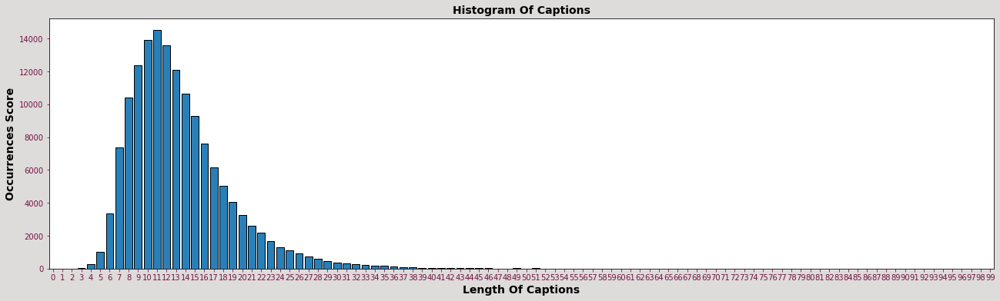

In [ ]:
caption_length = list(caption_length_dictionary.keys())
occurrences = list(caption_length_dictionary.values())
fig = plt.figure(figsize = (22, 6), facecolor='#dedbdb')
# Creating the bar plot
plt.bar(caption_length, occurrences, color=	"#2980b9", edgecolor ='black',
        width = 0.8)
plt.xlabel("Length Of Captions", fontweight='bold', fontsize="14")
plt.ylabel("Occurrences Score", fontweight='bold', fontsize="14")
plt.title("Histogram Of Captions", fontweight='bold',fontsize="14")
plt.tick_params(colors='#71143e', axis='both', labelsize=10)
# Show all lengths of captions
plt.xticks(caption_length)
# Start from x=0
plt.margins(x=0)
plt.rcParams.update({'font.family':'sans-serif'})
plt.rcParams.update({'axes.facecolor':'#dedbdb'})
plt.show()

### Μπορούμε να παρατηρήσουμε πως τα πιο συχνά μήκη των captions βρίσκονται κοντά στο μήκος 11. Επίσης μετά το μήκος 49 τα captions έχουν σχεδόν μηδενιστεί. Ουσιαστικά τα captions είτε μικρού μήκους είτε μεγάλου μήκους τα αφαιρούμε παρακάτω διότι δεν είναι πρακτικά στην εκπαίδευση του μοντέλου μας. Άλλωστε αν κάποιες εικόνες πλέον χαρακτηρίζονται από 3 ή 4 captions αντί για 5 τότε δεν έχουμε κλάδεψει κάποιο ουσιαστικό κομμάτι των δεδομένων εκπαίδευσης. Επιλέγουμε λοιπόν να κρατήσουμε τα 45 συχνότερα μήκη των captions. Στις αρχικές μας μετρήσεις χρησιμοποιούσαμε τα 35 συχνότερα μήκη, δηλαδή από μήκος 4 έως μήκος 39. Ωστόσο είχαμε αυξημένο loss από τις πρώτες εποχές εκπαίδευσης συγκριτικά με το loss που που είχαμε όταν κρατήσαμε τα 45 συχνότερα μήκη. Παρατηρήσαμε πως αυξάνοντας το μήκος στα 45 συχνότερα αυξήθηκε κατά 20sec ο χρόνος εκπαίδευσης αλλά μειώθηκε αισθητά το loss στις πρώτες εποχές και κατά συνέπεια πετυχαίνουμε καλύτερο training loss μετά το τέλος της εκπαίδευσης κάτι που με τη σειρά του οδηγεί σε καλύτερα corpus_bleu scores.

### Παρακάτω θα κρατήσουμε τα 45 συχνότερα μήκη των captions, δηλαδή εκείνα τα captions που έχουν **4<=μήκος<=49**

In [ ]:
print(f"Original length before removing captions: {len(caption_names)}")

Original length before removing captions: 148915


In [ ]:
# Ιnitialize empty dict to store the image_names as key and captions as values

image_names_and_caption_names = {}
for i in range(len(original_train_captions[0:len(original_train_captions)])):
  current_name = image_names[i]
  current_caption = caption_names[i]
  #print(current_name)
  #print(current_caption)
  # Ηere we checκ for duplicates
  if current_name in image_names_and_caption_names:
    # Ιf duplicate exists then we check the length of the caption
    words = nltk.word_tokenize(current_caption)
    if len(words) >= 50 or len(words) <= 3:
        continue
    else:
        # Ιf the length is between 4 and 49 then we append the current caption to the current image
        image_names_and_caption_names[current_name].append(current_caption)
  # Εlse we create new key and new value only if the length of the caption is between 4 and 49
  else:
    words = nltk.word_tokenize(current_caption)
    if len(words) >= 50 or len(words) <= 3:
        continue
    else:
        image_names_and_caption_names[current_name] = [current_caption]

Path to image is: ../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_1000070808.jpg
Captions of this image are: [' A little girl holds orange lilies while others celebrate an occasion in a garden setting .', ' A little girl at a wedding holds a bouquet of orange flowers .', ' Young girl in orange dress holding orange flowers .', ' a girl at a wedding holding some orange flowers', ' A girl holds a bouquet of flowers']


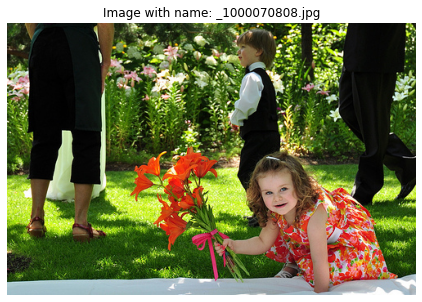

In [ ]:
# Print 1st image and the captions for that specific image

for key,value in image_names_and_caption_names.items():
  print(f"Path to image is: {key}")
  #print one value meaning one caption
  print(f"Captions of this image are: {value}")
  image = Image.open(key)
  fig = plt.figure(figsize=(50,5))
  ax = fig.add_subplot(1, 1, 1) 
  # Plot the image in the first axe with it's category name
  ax.axis('off')
  ax.set_title(f"Image with name: {key[len(PATH_TO_IMAGES) + 1:]}")
  ax.imshow(image);
  break

In [ ]:
import random
# Convert image_names_and_caption_names dict to list and then random suffle
image_paths = list(image_names_and_caption_names.keys())
# seed(42) to retain same shuffling 
random.seed(42)
random.shuffle(image_paths)

In [ ]:
len(image_paths)

29782

In [ ]:
image_paths[0]

'../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_75069180.jpg'

In [ ]:
train_captions = []
img_name_vector = []

for image_path in image_paths:
  caption_list = image_names_and_caption_names[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

In [ ]:
# Originally we had 148915 captions

print(f"After removing short or long captions we have length of captions: {len(train_captions)}")

After removing short or long captions we have length of captions: 148766


## Θυμόμαστε αρχικά είχαμε 148915 και πλέον έχουμε 148766 captions για όλες τις εικόνες μας. Αυτό διότι κρατήσαμε συγκεκριμένα μήκη στα captions.

 A woman leading a gray and black spotted dog in a red bandanna through a competition .


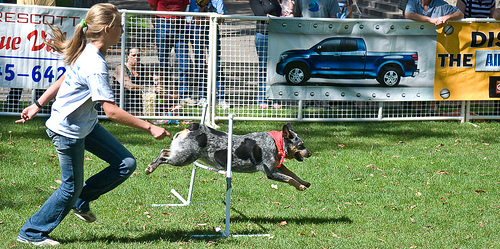

In [ ]:
#show random image and caption
print(train_captions[0])
Image.open(img_name_vector[0])

## Παρατηρήσαμε πως η εκπαίδευση ανα επόχη για όλες τις εικόνες ήταν αρκετά χρονοβόρα. Με σκοπό την εύρεση ενός αξιόπιστου μοντέλου αλλά και τη μείωση του χρόνου εκπαίδευσης προχωράμε στη διατήρηση τυχαίων 12.000 εικόνων με τα αντίστοιχα captions που έχουν. Οι εικόνες αυτές αν και τυχαίες έχουν οριστεί με random.seed(42) οπότε καθέ φορά που τρέχει το notebook είναι οι ίδιες. Με αυτό τον τρόπο μπορούμε να συνεχίζουμε την εκπαίδευση του μοντέλου μας παρακάτω από το σημείο που έχει μείνει κάθε φορά.

In [ ]:
len(img_name_vector), len(train_captions)

(148766, 148766)

In [ ]:
# We keep only 12.000 train images from the original 29782 train images

image_paths =  image_paths[:12000]

In [ ]:
len(image_paths)

12000

In [ ]:
train_captions = []
img_name_vector = []

for image_path in image_paths:
  caption_list = image_names_and_caption_names[image_path]
  train_captions.extend(caption_list)
  img_name_vector.extend([image_path] * len(caption_list))

In [ ]:
len(img_name_vector), len(train_captions)

(59944, 59944)

In [ ]:
train_captions[0]

' A woman leading a gray and black spotted dog in a red bandanna through a competition .'

## Πλέον έχουμε ομαδοποιησεί τα δεδομένα μας, καθώς έχουμε συγκεντρώσει τα paths για κάθε εικόνα και τα captions που αντιστοιχούν σε αυτή την εικόνα.
## Προχωράμε πλέον στη μέθοδο "Preprocess the images using Xception" καθώς αυτή η μέθοδος αντιστοιχεί στην παρούσα ομάδα.

In [ ]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.io.decode_jpeg(img, channels=3)
    # Here we preprocess image with Xception
    # The default input image size for Xception is 299x299.
    img = tf.keras.layers.Resizing(299, 299)(img)
    # The inputs pixel values are scaled between -1 and 1, sample-wise. 
    img = tf.keras.applications.xception.preprocess_input(img)
    return img, image_path

In [ ]:
# Loading the weights of imagenet model without including the fully connected layers.

image_model = tf.keras.applications.xception.Xception(include_top=False,
                                                weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

2022-03-08 20:34:45.818637: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-08 20:34:45.913371: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-08 20:34:45.914124: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-08 20:34:45.915244: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

83697664/83683744 [==============================] - 1s 0us/step


In [ ]:
# image_model.summary()
# See the information of the CNN output

image_model.layers[-1], image_model.layers[-1].output.shape 

(<keras.layers.core.Activation at 0x7f40341aaed0>,
 TensorShape([None, None, None, 2048]))

## **Caching the features extracted from Xception**

In [ ]:
!pip install tqdm
from tqdm import tqdm

## Παρακάτω αποθηκεύουμε τα χαρακτηριστικά που εξάγονται από κάθε εικόνα μέσω του Xception. Ωστόσο η κάθε εικόνα διαβάζεται από το input irectory οπου εχουμε το dataset μας.  To συγκεκριμενο directory είναι read-only οπότε αποθηκεύουμε τα npy αρχεία μας σε νέο directory το οποίο το ορίζουμε στο working directory. Μια εναλλακτική θα μπορούσε να είναι να τρέξουμε τον κώδικα ώστε στο dictionary με την ονομασία feature_dict να αποθηκεύσουμε τα χαρακτηριστικά κάθε εικόνας που εξάγονται από το Xception. Στη συνέχεια να σώσουμε μέσω joblib αυτό το dictionary και να το εισάγουμε ύστερα στο notebook ως dataset. Με αυτό το τρόπο εξοικονομούμε χώρο στo working output του kaggle και επίσης δε χρειάζεται να τρέχουμε κάθε φορά την εξαγωγή χαρακτηριστικών ώστε να εξοικονομήσουμε και πόρους από τη GPU. Αυτή η εναλλακτική δεν έχει υλοποιηθεί αλλά θα μπορούσε να είναι μια μελλοντική βελτίωση του παρών notebook. Προφανώς κάθε φορά που τρέχουμε το notebook επιλέγουμε πάντα τις ίδιες εικόνες παραπάνω καθώς έχει τεθεί random.seed(42) !

In [ ]:
os.mkdir('/kaggle/working/features/')

In [ ]:
# Get unique images

encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(
  load_image, num_parallel_calls=tf.data.AUTOTUNE).batch(32)

#feature_dict = {}
#print(encode_train)

for img, path in tqdm(image_dataset):
  batch_features = image_features_extract_model(img)
  batch_features = tf.reshape(batch_features,
                              (batch_features.shape[0], -1, batch_features.shape[3]))

  for bf, p in zip(batch_features, path):
    path_of_feature = p.numpy().decode("utf-8")
    # Save features extracted in the new path in working directory we just created
    new_path = '/kaggle/working/features/' + path_of_feature[len(PATH_TO_IMAGES) + 1:]
    np.save(new_path, bf.numpy())
    #feature_dict[path_of_feature] =  bf.numpy()

  0%|          | 0/375 [00:00<?, ?it/s]2022-03-08 20:34:59.646237: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-03-08 20:35:00.800580: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005
100%|██████████| 375/375 [02:21<00:00,  2.64it/s]


In [ ]:
# len(feature_dict)

In [ ]:
# In case we download the feature_dict, then upload it as dataset and save GPU resources

#!pip install --upgrade joblib
#import joblib
#joblib.dump(feature_dict, 'feature_dict.pkl')

# Aftewards upload feature_dict.pkl as dataset and skip the features extraction in future executions of this notebook

## **Preprocess and tokenize the captions**

## Nωρίτερα παρουσιάσαμε ένα ιστόγραμμα πριν την αφαίρεση των μικρών ή μεγάλων captions. Παρακάτω απεικονίζουμε το νέο ιστόγραμμα με τα αποδεκτά μήκη των captions. Υστερα εφαρμόζεται tokenizer στα captions.

In [ ]:
# Check new caption lengths
# Initialize dictionary: key->length of caption, value->occurences

reduced_caption_length_dictionary = {}
for i in range(100):
  reduced_caption_length_dictionary[i] = 0
for i in range(len(train_captions)):
  words = nltk.word_tokenize(train_captions[i].lower())
  reduced_caption_length_dictionary[len(words)] += 1

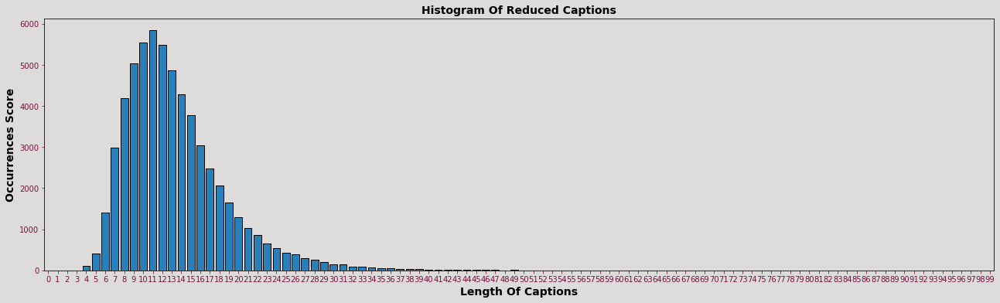

In [ ]:
caption_length = list(reduced_caption_length_dictionary.keys())
occurrences = list(reduced_caption_length_dictionary.values())
fig = plt.figure(figsize = (22, 6), facecolor='#dedbdb')
# creating the bar plot
plt.bar(caption_length, occurrences, color=	"#2980b9", edgecolor ='black',
        width = 0.8)
plt.xlabel("Length Of Captions", fontweight='bold', fontsize="14")
plt.ylabel("Occurrences Score", fontweight='bold', fontsize="14")
plt.title("Histogram Of Reduced Captions", fontweight='bold',fontsize="14")
plt.tick_params(colors='#71143e', axis='both', labelsize=10)
# show all lengths of captions
plt.xticks(caption_length)
# start from x=0
plt.margins(x=0)
plt.rcParams.update({'font.family':'sans-serif'})
plt.rcParams.update({'axes.facecolor':'#dedbdb'})
plt.show()

### Παρατηρούμε πλέον πως έχουμε μειώσει τα μήκη των captions ώστε να έχουν **4<=μήκος<=49**

### Εδώ τοποθετούμε τα start - end tokens στα captions.

In [ ]:
# Add start-end token in our training captions

def add_token (captions):
  for i, caption in enumerate (captions):
    captions[i] = '<start> ' + caption + ' <end>'
  return (captions)

In [ ]:
train_captions = add_token(train_captions)

In [ ]:
train_captions[0]

'<start>  A woman leading a gray and black spotted dog in a red bandanna through a competition . <end>'

In [ ]:
def calc_max_length(caption):
    max = -1
    for i in range(len(caption)):
        words = nltk.word_tokenize(caption[i])
        if len(words) > max:
            max = len(words)
    # subtrack 4 because of <>, <> that exist in start-end tokens
    return max - 4

In [ ]:
max_lengths = calc_max_length(train_captions)
print(f"Maximum length of our captions is: {max_lengths}")

Maximum length of our captions is: 51


### **Tokenize the captions**

In [ ]:
# Choose the top 10000 words from the vocabulary

top_k = 10000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                  oov_token="<unk>",
                                                  filters='!"#$%&()*+.,-/:;=?@[\]^_`{|}~ ')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'

In [ ]:
# Make list from dict

tokenizer.index2word = [tokenizer.index_word[ii] for ii in range(len(tokenizer.word_index)) ] 
tokenizer.index2word[:10] # see top-10 most frequent words

['<pad>', '<unk>', 'a', '<start>', '<end>', 'in', 'the', 'on', 'and', 'man']

In [ ]:
# Create the tokenized vectors

train_seqs = tokenizer.texts_to_sequences(train_captions)

In [ ]:
# Pad each vector to the max_length of the captions

cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post')

In [ ]:
# Find the maximum length of any caption in our dataset

def calc_max_length(tensor):
    return max(len(t) for t in tensor)

In [ ]:
# Calculates the max_length, which is used to store the attention weights later

max_length = calc_max_length(train_seqs)

In [ ]:
lenx = np.array([len(x) for x in cap_vector])
print(lenx.min(), lenx.mean())

50 50.0


## **Organize training set and test set**

In [ ]:
import collections

img_to_cap_vector = collections.defaultdict(list)
# Every image has its unique tokenized vectors
for img, cap in zip(img_name_vector, cap_vector):
  img_to_cap_vector[img].append(cap)

In [ ]:
# Extact a list of keys, again random.seed(42) is set to keep same results

img_keys = list(img_to_cap_vector.keys())
random.seed(42)
random.shuffle(img_keys)

In [ ]:
# Training set is 80% and validation set is 20% from the total 12.000 images selected earlier

slice_index = int(len(img_keys)*0.8)
img_name_train_keys, img_name_val_keys = img_keys[:slice_index], img_keys[slice_index:]

img_name_train = []
cap_train = []
for imgt in img_name_train_keys:
  capt_len = len(img_to_cap_vector[imgt])
  img_name_train.extend([imgt] * capt_len)
  cap_train.extend(img_to_cap_vector[imgt])

img_name_val = []
cap_val = []
for imgv in img_name_val_keys:
  capv_len = len(img_to_cap_vector[imgv])
  img_name_val.extend([imgv] * capv_len)
  cap_val.extend(img_to_cap_vector[imgv])

In [ ]:
len(img_name_train), len(cap_train), len(img_name_val), len(cap_val)

(47956, 47956, 11988, 11988)

In [ ]:
from sklearn.utils import shuffle

# Shuffle train captions and train image_names together so we don't have same images and captions in a row, again random_state = 42

cap_train, img_name_train = shuffle(cap_train,
                                    img_name_train,
                                    random_state=42)

In [ ]:
img_name_train[:5]

['../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_200961236.jpg',
 '../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_20697535.jpg',
 '../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_141579375.jpg',
 '../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_479351040.jpg',
 '../input/flickecemod/flickr30k-images-ecemod/flickr30k-images-ecemod/image_dir/_35290710.jpg']

In [ ]:
type(cap_train[0])

numpy.ndarray

# Create a tf.data dataset for training

In [ ]:
# bf holds the shape of the output batch feautures

bf.shape

TensorShape([100, 2048])

In [ ]:
# Set BATCH_SIZE according to your system's configuration 
# Also we set embedding_dim = 100 since later we will use the glove 100d pretrained model
# If other emdedding dimension is going to be used make sure to change embedding_dim below

BATCH_SIZE = 32
BUFFER_SIZE = 1000
embedding_dim = 100
units = 512
vocab_size = top_k + 1
num_steps = len(img_name_train) // BATCH_SIZE
features_shape = bf.shape[1] # 2048
attention_features_shape = bf.shape[0] # 100

In [ ]:
# Load the numpy files
def map_func(img_name, cap):
  #img_tensor = feature_dict[img_name.decode('utf-8')] 
  # Make sure to grab the image by selecting the correct slice from the path
  img_tensor = np.load('./features' + img_name[len(PATH_TO_IMAGES):].decode('utf-8') + '.npy')
  return img_tensor, cap

In [ ]:
dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))

# Use map to load the numpy files in parallel
dataset = dataset.map(lambda item1, item2: tf.numpy_function(
          map_func, [item1, item2], [tf.float32, tf.int32]),
          num_parallel_calls=tf.data.experimental.AUTOTUNE)

# Shuffle and batch
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

## **Load Pretrained Embeddings**

In [ ]:
# Import from our drive the glove 100d pretrained model

url = 'https://drive.google.com/uc?id=1tzzswz6y8e7difGj0DBHnYWztxrflZ0X'
output = 'glove.6B.100d.txt' 
gdown.download(url, output, quiet=False, fuzzy=True) 

Downloading...
From: https://drive.google.com/uc?id=1tzzswz6y8e7difGj0DBHnYWztxrflZ0X
To: /kaggle/working/glove.6B.100d.txt
100%|██████████| 347M/347M [00:03<00:00, 114MB/s]


'glove.6B.100d.txt'

In [ ]:
path_to_glove_file = './glove.6B.100d.txt'

In [ ]:
embeddings_index = {}
with open(path_to_glove_file) as f:
    for line in f:
        word, coefs = line.split(maxsplit=1)
        coefs = np.fromstring(coefs, "f", sep=" ")
        embeddings_index[word] = coefs

print("Found %s word vectors." % len(embeddings_index))

Found 400000 word vectors.


In [ ]:
# Remove the file since we don't need it anymore

os.remove('./glove.6B.100d.txt')

In [ ]:
len(tokenizer.word_index)

12572

## Παρατηρούμε πως το μήκος του tokenizer είναι πάνω από 12.000 ενώ εμείς έχουμε θέσει λεξιλόγιο ίσο με 10.000. Σε μια μελλοντική βελτίωση θα μπορούσαμε να θέσουμε εξαρχής το μήκος του λεξιλογίου ίσο με το  μήκος του tokenizer, με την προϋπόθεση πάντα πως όλες οι άλλες παράμετροι θα παραμείνουν σταθερές.

## Παρακάτω η συνάρτηση έχει σχεδιαστεί προσεκτικά για να επιστρέφει διανύσματα λέξεων με νόημα όσο καλύτερα γίνεται, προσπαθώντας να πετύχει όσο το δυνατόν περισσότερες λέξεις από το vocabulary.

In [ ]:
# We try to increase our hits by using: word.lower(), word.upper(), word.capitalize(), ps.stem(word), lc.stem(word), sb.stem(word)

from nltk.stem import PorterStemmer
ps = PorterStemmer()
from nltk.stem.lancaster import LancasterStemmer
lc = LancasterStemmer()
from nltk.stem import SnowballStemmer
sb = SnowballStemmer("english")


def build_matrix(word_index, embedding_index, vec_dim):
    hits = 0
    misses = 0
    embedding_matrix = np.zeros((len(word_index) + 1, vec_dim))
    for word, i in word_index.items():
        known = False
        for candidate in [word, word.lower(), word.upper(), word.capitalize(), 
                          ps.stem(word), lc.stem(word), sb.stem(word) ]:
            if candidate in embedding_index:
                embedding_matrix[i] = embedding_index[candidate]
                known = True
                hits += 1
                break
        if known == False: misses += 1
    
    print("Converted %d words (%d misses)" % (hits, misses))
    return embedding_matrix

In [ ]:
embedding_matrix = build_matrix(tokenizer.word_index, embeddings_index, embedding_dim)
print(embedding_matrix.shape)

Converted 12265 words (307 misses)
(12573, 100)


### Παρατηρούμε πως τα misses είναι πολύ λίγα μπροστά στο σύνολο των hits κατί το οποίο είναι αρκετά ενθαρρυντικό και οδηγεί σε καλύτερες επιδόσεις αργότερα.

# **Model**

## Στον RNN_Decoder βρίσκεται σε σχόλια η υλοποίηση με LSTM. Έγινε χρήση από 512 units GRU. Eπίσης γίνεται χρήση επιπέδου Dropout κοντά στα πυκνά επίπεδα και χρησιμοποιήσαμε τα embeddings που ορίσαμε προηγουμένως κάτι που μειώνει το πλήθος των βαρών προς εκπαίδευση και άρα το συνολικό χρόνο ανά εποχή.

In [ ]:
class BahdanauAttention(tf.keras.Model):
  def __init__(self, units):
    super(BahdanauAttention, self).__init__()
    self.W1 = tf.keras.layers.Dense(units)
    self.W2 = tf.keras.layers.Dense(units)
    self.V = tf.keras.layers.Dense(1)

  def call(self, features, hidden):
    # features(CNN_encoder output) shape == (batch_size, 64, embedding_dim)
    # hidden shape == (batch_size, hidden_size)
    # hidden_with_time_axis shape == (batch_size, 1, hidden_size)
    hidden_with_time_axis = tf.expand_dims(hidden, 1)
    # score shape == (batch_size, 64, hidden_size)
    score = tf.nn.tanh(self.W1(features) + self.W2(hidden_with_time_axis))

    # attention_weights shape == (batch_size, 64, 1)
    # you get 1 at the last axis because you are applying score to self.V
    attention_weights = tf.nn.softmax(self.V(score), axis=1)
    # context_vector shape after sum == (batch_size, hidden_size)
    context_vector = attention_weights * features
    context_vector = tf.reduce_sum(context_vector, axis=1)
    return context_vector, attention_weights

In [ ]:
class CNN_Encoder(tf.keras.Model):
    # This encoder passes those features through a Fully connected layer
    def __init__(self, embedding_dim):
        super(CNN_Encoder, self).__init__()
        # shape after fc == (batch_size, 64, embedding_dim)
        self.fc = tf.keras.layers.Dense(embedding_dim)
    def call(self, x):
        x = self.fc(x)
        x = tf.nn.relu(x)
        return x

In [ ]:
from keras.layers import Dropout

class RNN_Decoder(tf.keras.Model):
  def __init__(self, embedding_matrix, units, vocab_size):
    super(RNN_Decoder, self).__init__()
    self.units = units
    self.vocab_size = embedding_matrix.shape[0]
    # embedding_layer with pretrained model glove100
    self.embedding = tf.keras.layers.Embedding(self.vocab_size, embedding_matrix.shape[1], 
                                               embeddings_initializer=tf.keras.initializers.Constant(embedding_matrix),
                                               mask_zero=True,
                                               trainable=False)
    self.dropout = Dropout(rate=0.25)
    # Passing output dimension(units) to GRU with glorot_uniform initializer.
    self.gru = tf.keras.layers.GRU(self.units,
                                   return_sequences=True,
                                   return_state=True,
                                   recurrent_initializer='glorot_uniform')
    #self.lstm = tf.compat.v1.keras.layers.CuDNNLSTM(self.units,
    #                               return_sequences=True,
    #                               return_state=True,
    #                              recurrent_initializer='glorot_uniform')
    self.fc1 = tf.keras.layers.Dense(self.units)
    self.fc2 = tf.keras.layers.Dense(vocab_size)
    self.attention = BahdanauAttention(self.units)

  def call(self, x, features, hidden):
    # defining attention as a separate model
    context_vector, attention_weights = self.attention(features, hidden)
    # x shape after passing through embedding == (batch_size, 1, embedding_dim)
    x = self.embedding(x)
    # x shape after concatenation == (batch_size, 1, embedding_dim + hidden_size)
    x = tf.concat([tf.expand_dims(context_vector, 1), x], axis=-1)
    # passing the concatenated vector to the GRU
    output, state = self.gru(x)
    # passing the concatenated vector to the LSTM, uncomment below and comment above for RNN LSTM
    #output, state, _ = self.lstm(x)
    # insert dropout layer after GRU or LSTM
    output = self.dropout(output)
    # shape == (batch_size, max_length, hidden_size)
    x = self.fc1(output)
    # x shape == (batch_size * max_length, hidden_size)
    x = tf.reshape(x, (-1, x.shape[2]))
    # output shape == (batch_size * max_length, vocab)
    x = self.fc2(x)
    return x, state, attention_weights

  def reset_state(self, batch_size):
    return tf.zeros((batch_size, self.units))

In [ ]:
encoder = CNN_Encoder(embedding_dim)
decoder = RNN_Decoder(embedding_matrix, units, vocab_size)

In [ ]:
optimizer = tf.keras.optimizers.Adam()
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(
    from_logits=True, reduction='none')


def loss_function(real, pred):
  mask = tf.math.logical_not(tf.math.equal(real, 0))
  loss_ = loss_object(real, pred)

  mask = tf.cast(mask, dtype=loss_.dtype)
  loss_ *= mask

  return tf.reduce_mean(loss_)

## **Checkpoint**

In [ ]:
checkpoint_path = "./checkpoints/train"
ckpt = tf.train.Checkpoint(encoder=encoder,
                           decoder=decoder,
                           optimizer=optimizer)
ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

In [ ]:
start_epoch = 0
if ckpt_manager.latest_checkpoint:
  start_epoch = int(ckpt_manager.latest_checkpoint.split('-')[-1])
  # restoring the latest checkpoint in checkpoint_path
  ckpt.restore(ckpt_manager.latest_checkpoint)

# **Training**

In [ ]:
loss_plot = []

In [ ]:
@tf.function
def train_step(img_tensor, target):
  loss = 0
  # Initializing the hidden state for each batch
  # because the captions are not related from image to image
  hidden = decoder.reset_state(batch_size=target.shape[0])
  dec_input = tf.expand_dims([tokenizer.word_index['<start>']] * target.shape[0], 1)
  with tf.GradientTape() as tape:
      features = encoder(img_tensor)
      for i in range(1, target.shape[1]):
          # Passing the features through the decoder
          predictions, hidden, _ = decoder(dec_input, features, hidden)
          loss += loss_function(target[:, i], predictions)
          # Using teacher forcing
          dec_input = tf.expand_dims(target[:, i], 1)
  total_loss = (loss / int(target.shape[1]))
  trainable_variables = encoder.trainable_variables + decoder.trainable_variables
  gradients = tape.gradient(loss, trainable_variables)
  optimizer.apply_gradients(zip(gradients, trainable_variables))
  return loss, total_loss


## Παρακάτω ορίζουμε τη μεταβλητή LOAD_PRETRAINED_WEIGHTS = TRUE διότι φορτώνουμε τα βάρη στο μοντέλο μας από προηγούμενες εκπαιδεύσεις που έχουν πραγματοποιηθεί στις εικόνες και στις παραμέτρους που έχουν οριστεί παραπάνω. Ωστόσο κάποιος μπορεί να θέσει τη μεταβλητή σε False και να εκπαιδεύσει το μοντέλο από την αρχή. Σκοπός είναι η δημιουργία ενός notebook που να μπορεί να χρησιμοποιηθεί εκ νέου χωρίς μεγάλες αλλαγές στον κώδικα.

In [ ]:
LOAD_PRETRAINED_WEIGHTS = True

# Uncomment below to start training the model from the beginning.

#LOAD_PRETRAINED_WEIGHTS = False

In [ ]:
# Download previously trained weigths from our drive and save them in working output

if LOAD_PRETRAINED_WEIGHTS:
    url = 'https://drive.google.com/uc?id=18kf-U7JV6YfLh98fOtghKNCac5fNJN2r'
    output = 'decoder_light_v3.h5' 
    gdown.download(url, output, quiet=False, fuzzy=True) 
    url = 'https://drive.google.com/uc?id=1RZHZKDHYOL_czvMUyULZ2mc2maFoVIVQ'
    output = 'encoder_light_v3.h5' 
    gdown.download(url, output, quiet=False, fuzzy=True) 

Downloading...
From: https://drive.google.com/uc?id=18kf-U7JV6YfLh98fOtghKNCac5fNJN2r
To: /kaggle/working/decoder_light_v3.h5
100%|██████████| 32.3M/32.3M [00:00<00:00, 83.9MB/s]
Downloading...
From: https://drive.google.com/uc?id=1RZHZKDHYOL_czvMUyULZ2mc2maFoVIVQ
To: /kaggle/working/encoder_light_v3.h5
100%|██████████| 831k/831k [00:00<00:00, 71.2MB/s]


In [ ]:
# We run one epoch to initialize our model layers and then load the weights from previously trained sessions.
# Ηere we don't append the result in loss_plot since the plot will not be reliable because we will combine 1 untrained epoch and many
# previous trained epochs

if LOAD_PRETRAINED_WEIGHTS:
    
    EPOCHS = 1
    for epoch in tqdm(range(start_epoch, EPOCHS)):
        start = time.time()
        total_loss = 0
        for (batch, (img_tensor, target)) in enumerate(dataset):
            batch_loss, t_loss = train_step(img_tensor, target)
            total_loss += t_loss
            if batch % 400 == 0:
                average_batch_loss = batch_loss.numpy()/int(target.shape[1])
                print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
        print(f'Initial Epoch For Model Initialization Had Loss: {total_loss/num_steps:.6f}')
        print(f'Time taken for Initial Epoch {time.time()-start:.2f} sec\n')

  0%|          | 0/1 [00:00<?, ?it/s]

Epoch 1 Batch 0 Loss 2.5494
Epoch 1 Batch 400 Loss 1.0589
Epoch 1 Batch 800 Loss 1.1073
Epoch 1 Batch 1200 Loss 0.8424


100%|██████████| 1/1 [05:00<00:00, 300.93s/it]

Initial Epoch For Model Initialization Had Loss: 1.095652
Time taken for Initial Epoch 300.93 sec



## Παρατηρούμε το χαμηλό training loss το οποίο πετυχαίνουμε ήδη από την 1η εποχή.

In [ ]:
# Load pretrained weights. These weights are created after 40 training epochs.

if LOAD_PRETRAINED_WEIGHTS:
    encoder_filepath = './encoder_light_v3.h5'
    decoder_filepath = './decoder_light_v3.h5'
    encoder.load_weights(encoder_filepath, by_name=False, skip_mismatch=False, options=None)
    decoder.load_weights(decoder_filepath, by_name=False, skip_mismatch=False, options=None)

In [ ]:
# Existing weights have been created after 40 epochs have passed. So below we train them for another 10 epochs.
# Since we have already trained for 40 epochs we will train for another 10 epochs. A total of 50 epochs.

# If LOAD_PRETRAINED_WEIGHTS == False then our model is untrained and now it will start training and updating the weights. 
# We recommend 50 epochs for all the previous parameters in order for training loss to go under 0.36
# Approximately 3.3 hours training for 50 epochs with GPU

if LOAD_PRETRAINED_WEIGHTS:
    EPOCHS = 10
else:
    EPOCHS = 50

for epoch in tqdm(range(start_epoch, EPOCHS)):
    start = time.time()
    total_loss = 0
    for (batch, (img_tensor, target)) in enumerate(dataset):
        batch_loss, t_loss = train_step(img_tensor, target)
        total_loss += t_loss
        if batch % 400 == 0:
            average_batch_loss = batch_loss.numpy()/int(target.shape[1])
            print(f'Epoch {epoch+1} Batch {batch} Loss {average_batch_loss:.4f}')
    # Storing the epoch and loss value to plot later
    loss_plot.append(total_loss / num_steps)
    if epoch % 5 == 0:
      ckpt_manager.save()
    print(f'Epoch {epoch+1} Loss {total_loss/num_steps:.6f}')
    print(f'Time taken for 1 epoch {time.time()-start:.2f} sec\n')

  0%|          | 0/10 [00:00<?, ?it/s]

Epoch 1 Batch 0 Loss 0.4544
Epoch 1 Batch 400 Loss 0.4814
Epoch 1 Batch 800 Loss 0.4653
Epoch 1 Batch 1200 Loss 0.4194


 10%|█         | 1/10 [03:30<31:31, 210.19s/it]

Epoch 1 Loss 0.437551
Time taken for 1 epoch 210.19 sec

Epoch 2 Batch 0 Loss 0.4826
Epoch 2 Batch 400 Loss 0.3565
Epoch 2 Batch 800 Loss 0.4300
Epoch 2 Batch 1200 Loss 0.3939


 20%|██        | 2/10 [07:01<28:04, 210.57s/it]

Epoch 2 Loss 0.370418
Time taken for 1 epoch 210.84 sec

Epoch 3 Batch 0 Loss 0.3445
Epoch 3 Batch 400 Loss 0.3633
Epoch 3 Batch 800 Loss 0.3899
Epoch 3 Batch 1200 Loss 0.2937


 30%|███       | 3/10 [10:32<24:36, 210.89s/it]

Epoch 3 Loss 0.358376
Time taken for 1 epoch 211.27 sec

Epoch 4 Batch 0 Loss 0.2768
Epoch 4 Batch 400 Loss 0.3634
Epoch 4 Batch 800 Loss 0.3363
Epoch 4 Batch 1200 Loss 0.3365


 40%|████      | 4/10 [14:03<21:06, 211.16s/it]

Epoch 4 Loss 0.354228
Time taken for 1 epoch 211.56 sec

Epoch 5 Batch 0 Loss 0.3296
Epoch 5 Batch 400 Loss 0.3480
Epoch 5 Batch 800 Loss 0.4081
Epoch 5 Batch 1200 Loss 0.3276


 50%|█████     | 5/10 [17:35<17:37, 211.46s/it]

Epoch 5 Loss 0.354611
Time taken for 1 epoch 212.00 sec

Epoch 6 Batch 0 Loss 0.3378
Epoch 6 Batch 400 Loss 0.3637
Epoch 6 Batch 800 Loss 0.3087
Epoch 6 Batch 1200 Loss 0.3439


 60%|██████    | 6/10 [21:09<14:08, 212.03s/it]

Epoch 6 Loss 0.351938
Time taken for 1 epoch 213.13 sec

Epoch 7 Batch 0 Loss 0.3291
Epoch 7 Batch 400 Loss 0.3075
Epoch 7 Batch 800 Loss 0.3339
Epoch 7 Batch 1200 Loss 0.3714


 70%|███████   | 7/10 [24:41<10:36, 212.24s/it]

Epoch 7 Loss 0.350306
Time taken for 1 epoch 212.68 sec

Epoch 8 Batch 0 Loss 0.3593
Epoch 8 Batch 400 Loss 0.3012
Epoch 8 Batch 800 Loss 0.3277
Epoch 8 Batch 1200 Loss 0.3702


 80%|████████  | 8/10 [28:14<07:04, 212.40s/it]

Epoch 8 Loss 0.348337
Time taken for 1 epoch 212.74 sec

Epoch 9 Batch 0 Loss 0.3562
Epoch 9 Batch 400 Loss 0.3447
Epoch 9 Batch 800 Loss 0.3865
Epoch 9 Batch 1200 Loss 0.3035


 90%|█████████ | 9/10 [33:22<04:02, 242.28s/it]

Epoch 9 Loss 0.348032
Time taken for 1 epoch 307.97 sec

Epoch 10 Batch 0 Loss 0.4128
Epoch 10 Batch 400 Loss 0.3978
Epoch 10 Batch 800 Loss 0.2905
Epoch 10 Batch 1200 Loss 0.3459


100%|██████████| 10/10 [39:08<00:00, 234.83s/it]

Epoch 10 Loss 0.349134
Time taken for 1 epoch 345.87 sec



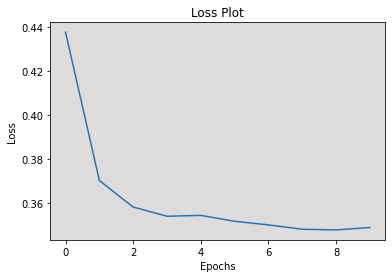

In [ ]:
plt.plot(loss_plot)
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.title('Loss Plot')
plt.show()

## Σε αυτό το σημείο να τονίσουμε πως η καμπύλη της ευθείας έχει αρχίσει να οριζοντιώνεται και πολλές φορές έχουμε ακόμα και μικρή επιδείνωση του training loss, κάτι που μας δείχνει πως επιπλεόν εκπαίδευση δε θα έχει δραστικές αλλαγές στις επιδόσεις μας. Είναι ένα καλό σημείο μετά από 50 εποχές να τερματίσουμε την εκπαίδευση και να αξιολογήσουμε την απόδοση.

In [ ]:
# Save weigths of our model for later use if needed

encoder.save_weights('encoder_light_v4.h5')
decoder.save_weights('decoder_light_v4.h5')
!ls -sh

total 65M
1.2M __notebook__.ipynb    31M decoder_light_v4.h5  500K features
4.0K checkpoints	  812K encoder_light_v3.h5
 31M decoder_light_v3.h5  812K encoder_light_v4.h5


# **Evaluation**

## Για την αξιολόγηση του μοντέλου μας παρακάτω έχουν υλοποιηθεί οι συναρτήσεις εύρεσης του predicted caption με 4 διαφορετικούς τρόπους:

* tf.random.categorical
* Next best word (greedy-search)
* Top k sampling (k=2, k=3)
* Beam Search (beam width = 2)

In [ ]:
def random_categorical_evaluate_while_training(image):
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []
    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        predicted_id = tf.random.categorical(predictions, 1)[0][0].numpy()
        result.append(tokenizer.index_word[predicted_id])
        if tokenizer.index_word[predicted_id] == '<end>':
            return result
        dec_input = tf.expand_dims([predicted_id], 0)
    return result

In [ ]:
def greedy_evaluate_while_training(image):
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []
    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        predicted_probs, predicted_ids = tf.math.top_k(predictions, k = 1, sorted = True) 
        # Convert to numpy and then take the first element that is a list that contains the index_word
        predicted_ids = predicted_ids.numpy()[0]
        # Take the first element of the above list
        predicted_ids = predicted_ids[0]
        #print(predicted_ids)
        # Append to result after taking the word that is converted by the tokenizer
        result.append(tokenizer.index_word[predicted_ids])
        if tokenizer.index_word[predicted_ids] == '<end>':
            return result
        dec_input = tf.expand_dims([predicted_ids], 0)
    return result

In [ ]:
# k could be 2, 3, 4, ...

def top_k_sampling_evaluate_while_training(image, k):
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []
    for i in range(max_length):
        predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
        top_k_predicted_probs, top_k_predicted_ids = tf.math.top_k(predictions, k = k, sorted = True)
        sample_top_k_ids = tf.random.categorical(top_k_predicted_probs, 1, dtype=tf.int32)
        predicted_ids = tf.gather_nd(top_k_predicted_ids, sample_top_k_ids, batch_dims = 1)
        predicted_ids = tf.reshape(predicted_ids, (-1,))
        predicted_ids = predicted_ids.numpy()[0]
        #print(predicted_ids)
        result.append(tokenizer.index_word[predicted_ids])
        if tokenizer.index_word[predicted_ids] == '<end>':
            return result
        dec_input = tf.expand_dims([predicted_ids], 0)
    return result

In [ ]:
# Import math Library 
# k must be 2 if k=1 or k>3 this function will not work
import math 

def beam_search_evaluate_width_two(image, k):
    hidden = decoder.reset_state(batch_size=1)
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    features = encoder(img_tensor_val)
    dec_input = tf.expand_dims([tokenizer.word_index['<start>']], 0)
    result = []
    initial = 0
    prev_probs = []
    prev_ids = []
    for i in range(max_length):
        # The first time we initialize beam search
        if initial == 0:
            predictions, hidden, attention_weights = decoder(dec_input, features, hidden)
            top_k_predicted_probs, top_k_predicted_ids = tf.math.top_k(predictions, k = k, sorted = True)
            top_k_predicted_ids = top_k_predicted_ids.numpy()[0]
            top_k_predicted_probs = top_k_predicted_probs.numpy()[0]
            #print(f"First ids are: {top_k_predicted_ids}")
            #print(f"First probs are: {top_k_predicted_probs}")
            initial +=1
            # Keep the previous probs
            prev_probs.append(math.log(top_k_predicted_probs[0]))
            prev_probs.append(math.log(top_k_predicted_probs[1]))
            prev_ids.append(top_k_predicted_ids[0])
            prev_ids.append(top_k_predicted_ids[1])
            # Expand in 2 branches 
            dec_input_first = tf.expand_dims([top_k_predicted_ids[0]], 0)
            dec_input_second = tf.expand_dims([top_k_predicted_ids[1]], 0)
        else:
            #print(f"Previous probs are: {prev_probs}")
            predictions_first, hidden, attention_weights = decoder(dec_input_first, features, hidden)
            predictions_second, hidden, attention_weights = decoder(dec_input_second, features, hidden)
            # The first k predictions and probabilities for the two branches
            top_k_predicted_probs_first, top_k_predicted_ids_first = tf.math.top_k(predictions_first, k = k, sorted = True)
            top_k_predicted_probs_second, top_k_predicted_ids_second = tf.math.top_k(predictions_second, k = k, sorted = True)
            # Convert ids and probs of the first branch into numpy array 
            top_k_predicted_ids_first = top_k_predicted_ids_first.numpy()[0]
            top_k_predicted_probs_first = top_k_predicted_probs_first.numpy()[0]
            # Convert ids and probs of the second branch into numpy array 
            top_k_predicted_ids_second = top_k_predicted_ids_second.numpy()[0]
            top_k_predicted_probs_second = top_k_predicted_probs_second.numpy()[0]
            #print(f"Next ids of first branch are: {top_k_predicted_ids_first}")
            #print(f"Next probs of first branch are: {top_k_predicted_probs_first}")
            #print(f"Next ids of second branch are: {top_k_predicted_ids_second}")
            #print(f"Next probs of second branch are: {top_k_predicted_probs_second}")
            # Decision what branch to keep... we multiply previous probability with the new current sub branch and keep the branch with the best probability
            # We use math.log to decrease the probs values
            calc_first_branch = math.log(prev_probs[0]*top_k_predicted_probs_first[0] +  prev_probs[0]*top_k_predicted_probs_first[1])
            calc_second_branch = math.log(prev_probs[1]*top_k_predicted_probs_second[0] +  prev_probs[1]*top_k_predicted_probs_second[1])
            #print(f"Calcs for first branch are: {calc_first_branch}")
            #print(f"Calcs for second branch are: {calc_second_branch}")
            if calc_first_branch >= calc_second_branch:
                dec_input_first = tf.expand_dims([top_k_predicted_ids_first[0]], 0)
                dec_input_second = tf.expand_dims([top_k_predicted_ids_first[1]], 0)
                #print(prev_probs[0]*top_k_predicted_probs_first[0])
                #print(prev_probs[0]*top_k_predicted_probs_first[1])
                temp = prev_probs[0]
                prev_probs[0] = math.log(temp*top_k_predicted_probs_first[0])
                prev_probs[1] = math.log(temp*top_k_predicted_probs_first[1])
                #print(prev_probs)
                result.append(tokenizer.index_word[prev_ids[0]])
                if tokenizer.index_word[prev_ids[0]] == '<end>':
                    return result
                #print(result)
                prev_ids[0] = top_k_predicted_ids_first[0]
                prev_ids[1] = top_k_predicted_ids_first[1]
            else:
                dec_input_first = tf.expand_dims([top_k_predicted_ids_second[0]], 0)
                dec_input_second = tf.expand_dims([top_k_predicted_ids_second[1]], 0)
                temp = prev_probs[1]
                prev_probs[0] = math.log(temp*top_k_predicted_probs_second[0])
                prev_probs[1] = math.log(temp*top_k_predicted_probs_second[1])
                result.append(tokenizer.index_word[prev_ids[1]])
                if tokenizer.index_word[prev_ids[1]] == '<end>':
                    return result
                #print(result)
                prev_ids[0] = top_k_predicted_ids_second[0]
                prev_ids[1] = top_k_predicted_ids_second[1]
    return result

In [ ]:
# Shuffle validation set

from sklearn.utils import shuffle

cap_val, img_name_val = shuffle(cap_val, img_name_val, random_state=12)

## **Αξιολογούμε το μοντέλο μας για το 1/3 του validation set.**

In [ ]:
def get_caption_random_categorical(images_input):
    actual = []
    predicted_captions = []
    for ii in range(len(images_input)//3):
    #for ii in range(1000):
        rid = ii
        image = images_input[rid]
        real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
        # remove start, end from captions
        real_caption = real_caption[8:-6]
        words = nltk.word_tokenize(str(real_caption))
        actual.append(words)
        result = random_categorical_evaluate_while_training(image)
        # remove end from final predicted caption
        if result[-1] == "<end>":
            predicted_captions.append(result[:len(result) - 1])
        else:
            predicted_captions.append(result)
    return actual, predicted_captions

In [ ]:
def get_caption_greedy(images_input):
    actual = []
    predicted_captions = []
    for ii in range(len(images_input)//3):
    #for ii in range(1000):
        rid = ii
        image = images_input[rid]
        real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
        # remove start, end from captions
        real_caption = real_caption[8:-6]
        words = nltk.word_tokenize(str(real_caption))
        actual.append(words)
        result = greedy_evaluate_while_training(image)
        # remove end from final predicted caption
        if result[-1] == "<end>":
            predicted_captions.append(result[:len(result) - 1])
        else:
            predicted_captions.append(result)
    return actual, predicted_captions

In [ ]:
def get_caption_top_k_search(images_input, k):
    actual = []
    predicted_captions = []
    for ii in range(len(images_input)//3):
    #for ii in range(1000):
        rid = ii
        image = images_input[rid]
        real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
        # remove start, end from captions
        real_caption = real_caption[8:-6]
        words = nltk.word_tokenize(str(real_caption))
        actual.append(words)
        # set beam width = 2
        result = top_k_sampling_evaluate_while_training(image, k)
        # remove end from final predicted caption
        if result[-1] == "<end>":
            predicted_captions.append(result[:len(result) - 1])
        else:
            predicted_captions.append(result)
    return actual, predicted_captions

In [ ]:
def get_caption_test_beam_search(images_input, k):
    actual = []
    predicted_captions = []
    for ii in range(len(images_input)//3):
    #for ii in range(1000):
        rid = ii
        image = images_input[rid]
        real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
        # remove start, end from captions
        real_caption = real_caption[8:-6]
        words = nltk.word_tokenize(str(real_caption))
        actual.append(words)
        # set beam width = 2
        result = beam_search_evaluate_width_two(image, k)
        # remove end from final predicted caption
        if result[-1] == "<end>":
            predicted_captions.append(result[:len(result) - 1])
        else:
            predicted_captions.append(result)
    return actual, predicted_captions

# **BLEU SCORE**

## Αν θεωρήσουμε ότι κάθε εικόνα έχει κάποια αληθινά captions (references) και το νευρωνικό παράγει ένα δικό του caption (hypothesis) θα χρησιμοποιήσουμε τo BLEU (Bilingual Evaluation Understudy) score, μεταξύ hypothesis και references. Σε όλες τις περιπτώσεις έγινε χρήση των εξής παραμέτρων: weights=(0.4, 0.3, 0.2, 0.1) και smoothing_function=SmoothingFunction().method1.

In [ ]:
from nltk.translate.bleu_score import corpus_bleu
from nltk.translate.bleu_score import sentence_bleu
from nltk.translate.bleu_score import SmoothingFunction

In [ ]:
# For sentence_bleu references must be a list of lists and hypothesis must be a list
# Example given below

references= [['this', 'is', 'small', 'test']]
hypothesis = ['this', 'is', 'a', 'test']
score1= sentence_bleu(references, hypothesis, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
print(score1)

0.27969334299067156


In [ ]:
# For corpus_bleu references must be a list containing list of lists and hypothesis must be a list of lists
# Example given below

references = [[['this', 'is', 'not', 'a', 'test']], [['this', 'is', 'a', 'test']]]
hypothesis = [['this', 'is', 'a', 'test'], ['this', 'is', 'some', 'test']]
score1 = corpus_bleu(references, hypothesis, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
print(score1)

0.24081992368947264


## Παρακάτω παίρνουμε τα captions για κάθε τρόπο εκτίμησης της επίδοσης που έχουμε υλοποιήσει στο 1/3 του validation set για μείωση του χρόνου εμφάνισης αποτελέσματος.

In [ ]:
# actual and predicted captions of validation images with random_categorical evaluation

references_random, hypothesis_random = get_caption_random_categorical(img_name_val)

In [ ]:
# actual and predicted captions of validation images with greedy evaluation

references_greedy, hypothesis_greedy = get_caption_greedy(img_name_val)

In [ ]:
# actual and predicted captions of validation images with random sampling top_2 evaluation

references_top_k_two, hypothesis_top_k_two = get_caption_top_k_search(img_name_val, 2)

In [ ]:
# actual and predicted captions of validation images with random sampling top_3 evaluation

references_top_k_three, hypothesis_top_k_three = get_caption_top_k_search(img_name_val, 3)

In [ ]:
# actual and predicted captions of validation images with beam search and beam_width=2

references_beam_two, hypothesis_beam_two = get_caption_test_beam_search(img_name_val, 2)

In [ ]:
references_random == references_greedy == references_top_k_two == references_top_k_three == references_beam_two

True

In [ ]:
len(hypothesis_random), len(hypothesis_greedy), len(hypothesis_top_k_two), len(hypothesis_top_k_three),  len(hypothesis_beam_two)

(3996, 3996, 3996, 3996, 3996)

In [ ]:
# Obvisously these two caption lists are not the same, but have the same length

hypothesis_random == hypothesis_greedy

False

In [ ]:
# Obvisously these two caption lists are not the same, but have the same length

hypothesis_top_k_two == hypothesis_top_k_three

False

In [ ]:
hypothesis_top_k_two == hypothesis_beam_two

False

## Aξιολόγηση 20 τυχαίων captions του validation set με την **sentence_bleu**

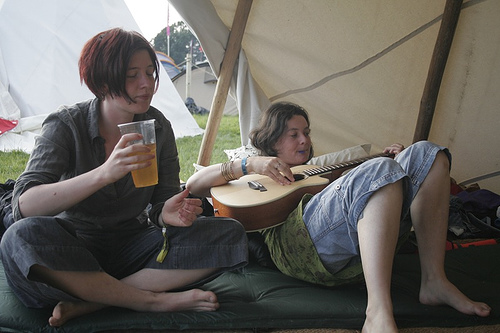

Real Caption is: ['two', 'young', 'women', 'drink', 'beer', 'and', 'play', 'guitar', 'in', 'tent', 'at', 'outdoor', 'event']
Random Categorical Caption is: ['a', 'man', 'is', 'taking', 'his', 'son']
Greedy Caption is: ['a', 'man', 'is', 'sitting', 'on', 'a', 'bench']
Top k=2 Sampling Caption is: ['the', 'man', 'with', 'blond', 'person', 'sits', 'down', 'wearing', 'green', 'sits', 'on', 'a', 'bench', 'while', 'two', 'women', 'are', 'sitting', 'on', 'the', 'top', 'of', 'a', 'small', 'other', 'one']
Top k=3 Sampling Caption is: ['a', 'man', 'and', 'a', 'purple', 'shirt', 'sits', 'on', 'top', 'of', 'a', 'green', 'live']
Beam Search Caption with k=2 is: ['a', 'woman', 'in', 'an', 'acoustic', 'guitar']
Sentence bleu score with Random.categorical is: 0
Sentence bleu score with Greedy Search is: 0
Sentence bleu score with Top k=2 Sampling is: 0.013268615967841162
Sentence bleu score with Top k=3 Sampling is: 0.02100824377499382
Sentence bleu score with Beam Search k=2 is: 0.02111832540652655



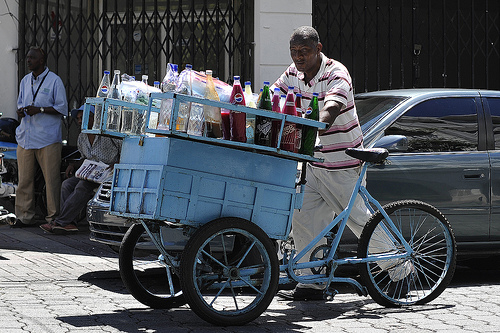

Real Caption is: ['a', 'man', 'is', 'pushing', 'a', 'bike', 'with', 'a', 'large', 'basket', 'filled', 'with', 'drinks']
Random Categorical Caption is: ['children', 'in', 'the', 'cart', 'of', 'a', 'car']
Greedy Caption is: ['street', 'with', 'yellow', 'shirt', 'and', 'shoes']
Top k=2 Sampling Caption is: ['street', 'selling', 'things', 'on', 'the', 'side', 'of', 'a', 'blue', 'door']
Top k=3 Sampling Caption is: ['street', 'in', 'yellow', 'and', 'green', 'buckets', 'to', 'an', 'amusement']
Beam Search Caption with k=2 is: ['children', 'thinking', 'on', 'a', 'house', 'van', 'as', 'he', 'works', 'on', 'the', 'background']
Sentence bleu score with Random.categorical is: 0.018041099254328966
Sentence bleu score with Greedy Search is: 0.016004697837814864
Sentence bleu score with Top k=2 Sampling is: 0.020811869844607936
Sentence bleu score with Top k=3 Sampling is: 0
Sentence bleu score with Beam Search k=2 is: 0.021100572477841795



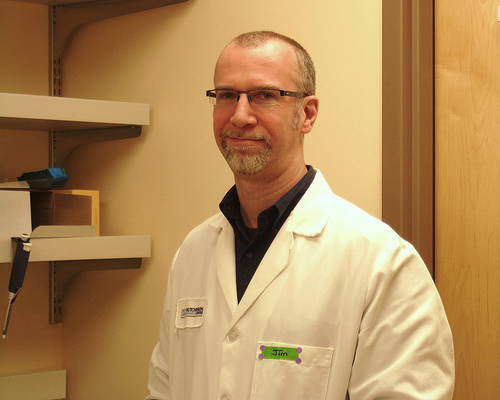

Real Caption is: ['a', 'man', 'named', 'jim', 'in', 'a', 'lab', 'coat', 'smiles', 'at', 'the', 'camera']
Random Categorical Caption is: ['rides', 'a', 'microscope']
Greedy Caption is: ['rides', 'a', 'microscope']
Top k=2 Sampling Caption is: ['rides', 'a', 'microscope', 'between', 'the', 'polo']
Top k=3 Sampling Caption is: ['rides', 'a', 'microscope', 'between', 'a', 'microscope', 'with', 'glasses', 'in', 'a', 'blue', 'shirt', 'and', 'glasses', 'sitting', 'down', 'and', 'is', 'holding', 'glasses', 'of', 'an', 'older', 'man', 'wearing', 'glasses', 'and', 'glasses', 'and', 'a', 'blue', 'shirt', 'and', 'glasses', 'sits', 'at', '<unk>']
Beam Search Caption with k=2 is: ['blond', 'male', 'with', 'glasses', 'looks', 'to', 'shave']
Sentence bleu score with Random.categorical is: 0.006545744563512318
Sentence bleu score with Greedy Search is: 0.006545744563512318
Sentence bleu score with Top k=2 Sampling is: 0.024948353621285262
Sentence bleu score with Top k=3 Sampling is: 0.0265127673749460

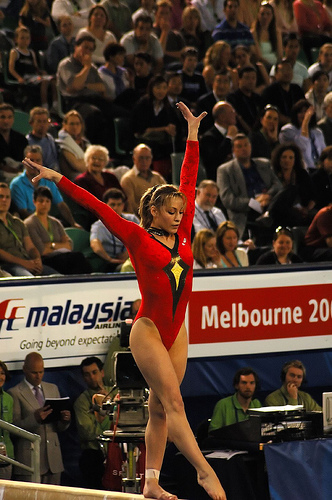

Real Caption is: ['the', 'woman', 'performing', 'gymnastics', 'in', 'olympics', 'possibly', '<', 'unk', '>']
Random Categorical Caption is: ['a', 'young', 'man', 'in', 'a', 'intense', 'game']
Greedy Caption is: ['a', 'young', 'man', 'is', 'currently', 'in', 'the', 'stadium']
Top k=2 Sampling Caption is: ['a', 'female', 'resting', 'on', 'the', 'of', 'the', 'rodeo']
Top k=3 Sampling Caption is: ['a', 'female', 'raises', 'her']
Beam Search Caption with k=2 is: ['a', 'female', 'is', 'currently', 'submerged', 'in', 'front', 'of', 'a', 'recital']
Sentence bleu score with Random.categorical is: 0.027694224111622145
Sentence bleu score with Greedy Search is: 0.03728599358154633
Sentence bleu score with Top k=2 Sampling is: 0.028257499085175063
Sentence bleu score with Top k=3 Sampling is: 0
Sentence bleu score with Beam Search k=2 is: 0.028093085811869447



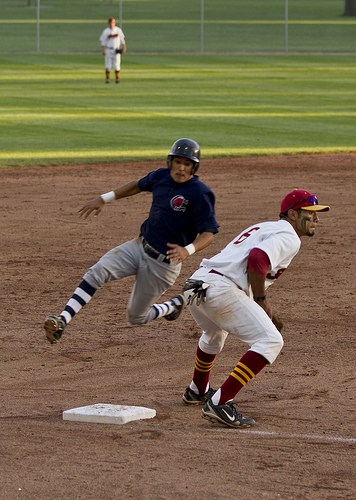

Real Caption is: ['a', 'baseball', 'player', 'wearing', 'a', 'blue', 'shirt', 'is', 'running', 'toward', 'a', 'base']
Random Categorical Caption is: ['the', 'player', 'throws', 'the', 'ball']
Greedy Caption is: ['a', 'man', 'throws', 'the', 'ball']
Top k=2 Sampling Caption is: ['a', 'player', 'throws', 'the', 'pitch']
Top k=3 Sampling Caption is: ['a', 'man', 'in', 'an', 'audience', 'interacting', 'with', 'a', 'baseball', 'uniform', 'has', 'just', 'kicked', 'the', 'ball', 'one', 'man', 'is', 'catching', 'a', 'baseball', 'uniform']
Beam Search Caption with k=2 is: ['the', 'runner', 'in', 'the', 'air', 'while', 'a', 'baseball', 'uniform', 'packed', 'black', 'baseball', 'player', 'throws', 'a', 'game']
Sentence bleu score with Random.categorical is: 0.016078831192678122
Sentence bleu score with Greedy Search is: 0.016078831192678122
Sentence bleu score with Top k=2 Sampling is: 0.021216144954720753
Sentence bleu score with Top k=3 Sampling is: 0.04548537522986158
Sentence bleu score with 

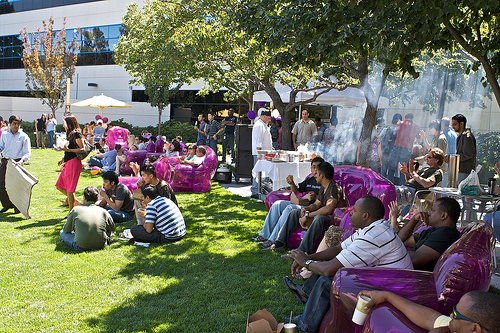

Real Caption is: ['crowd', 'of', 'people', 'sitting', 'outside', 'on', 'green', 'grass']
Random Categorical Caption is: ['a', 'performance', 'of', 'people', 'converse', 'sitting', 'and', 'one', 'women', 'in', 'a', 'crowd']
Greedy Caption is: ['a', 'group', 'of', 'people', 'converse', 'and', 'talking']
Top k=2 Sampling Caption is: ['a', 'group', 'of', 'people', 'are', 'sitting', 'in', 'the', 'shade']
Top k=3 Sampling Caption is: ['people', 'sitting', 'in', 'the', 'background']
Beam Search Caption with k=2 is: ['people', 'are', 'enjoying', 'drinks']
Sentence bleu score with Random.categorical is: 0.07967268285693077
Sentence bleu score with Greedy Search is: 0.09702537686586153
Sentence bleu score with Top k=2 Sampling is: 0.09803694489756798
Sentence bleu score with Top k=3 Sampling is: 0.09421109671894612
Sentence bleu score with Beam Search k=2 is: 0.03323067370051203



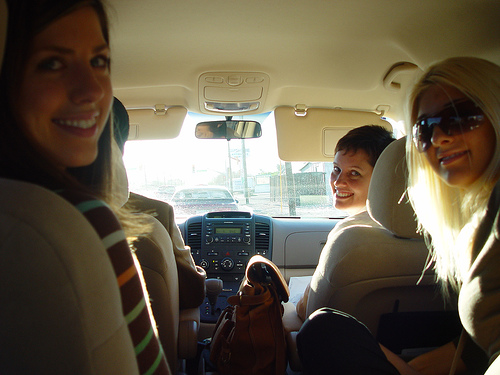

Real Caption is: ['three', 'women', 'in', 'a', 'vehicle', 'are', 'looking', 'back', 'and', 'smiling']
Random Categorical Caption is: ['one', 'blond', 'girl', 'pose', 'for', 'the', 'camera', 'while', 'participating', 'the', 'photographer', 'above', 'camera']
Greedy Caption is: ['a', 'man', 'is', 'checks', 'live', 'for', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a', 'dish', 'a', 'photo', 'in', 'a']
Top k=2 Sampling Caption is: ['a', 'man', 'and', 'a', 'woman', 'taking', 'dinner', 'together', 'whilst', 'sharing', 'for', 'a', 'picture', 'of', 'a', 'photo', 'with', 'picture', 'taken', 'enjoy', 'each']
Top k=3 Sampling Caption is: ['one', 'blond', 'woman', 'and', 'a', 'man', 'sits', 'before', 'a', 'face']
Beam Search Caption with k=2 is: ['a', 'blond', 'woman', 'checks', 'live', 'for',

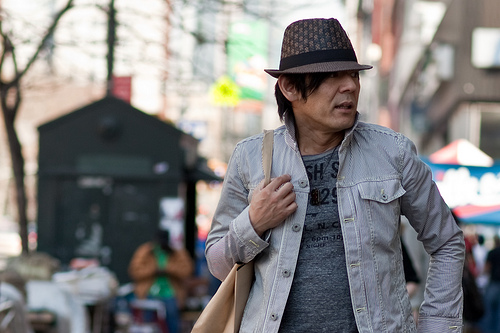

Real Caption is: ['a', 'man', 'wearing', 'a', 'hat', 'and', 'carrying', 'a', 'bag']
Random Categorical Caption is: ['a', 'man', 'with', 'a', 'gray', 'tank', 'top', 'hat', 'and', 'white', 'hat', 'and', 'a', 'white', 'hat', 'and', 'hat', 'with', 'lots', 'of', 'her']
Greedy Caption is: ['a', 'man', 'in', 'a', 'white', 'tank', 'top', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat', 'and', 'black', 'hat']
Top k=2 Sampling Caption is: ['a', 'man', 'wearing', 'a', 'hat', 'and', 'plaid', 'scarf', 'on', 'his', 'shoulder']
Top k=3 Sampling Caption is: ['a', 'man', 'in', 'a', 'white', 'dress', 'and', 'straw', 'hat', 'holding', 'a', 'cup', 'with', 'a', 'cup', 'with', 'his', 'mouth', 'and', 'a', 'yellow', 'device']
Beam Search Caption with k=2 is

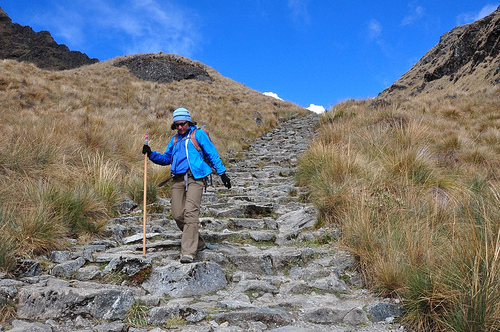

Real Caption is: ['a', 'woman', 'with', 'a', 'walking', 'stick', 'climbing', 'down', 'stone', 'stairs']
Random Categorical Caption is: ['a', 'man', 'with', 'a', 'red', '<unk>', 'and', 'a', 'large', 'back', 'of', 'a', 'trail', 'with', 'a', 'picture', 'of', 'a', 'large', 'back', 'of', 'a', 'large', 'car']
Greedy Caption is: ['a', 'person', 'in', 'a', 'blue', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown', 'hat', 'and', 'red', 'short', 'brown']
Top k=2 Sampling Caption is: ['a', 'person', 'in', 'a', 'blue', 'hat', 'and', 'blue', 'shirt', 'is', 'walking', 'down', 'a', 'street']
Top k=3 Sampling Caption is: ['a', 'person', 'on', 'a', 'large', 'statue']
Beam Search Caption with k=2 is: ['an', 'elderly', 'couple', 'walking', 'down', 

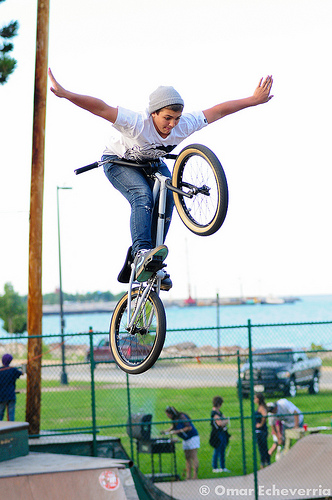

Real Caption is: ['a', 'young', 'person', 'doing', 'a', 'high', 'flying', 'bike', 'trick', 'with', 'his', 'or', 'her', 'arms', 'out']
Random Categorical Caption is: ['a', 'main', 'biker', 'rides', 'his', 'bicycle', 'by', 'the', 'ground']
Greedy Caption is: ['a', 'man', 'rides', 'a', 'unicycle', 'in', 'the', 'background']
Top k=2 Sampling Caption is: ['a', 'main', 'clad', 'shoes', 'is', 'riding', 'his', 'back', 'of', 'him']
Top k=3 Sampling Caption is: ['a', 'biker', 'gives', 'his', 'back']
Beam Search Caption with k=2 is: ['there', 'rides', 'his', 'chest']
Sentence bleu score with Random.categorical is: 0.021449817958841443
Sentence bleu score with Greedy Search is: 0.019957754188208388
Sentence bleu score with Top k=2 Sampling is: 0.022483514724743105
Sentence bleu score with Top k=3 Sampling is: 0.011643667224208322
Sentence bleu score with Beam Search k=2 is: 0.005774625212452972



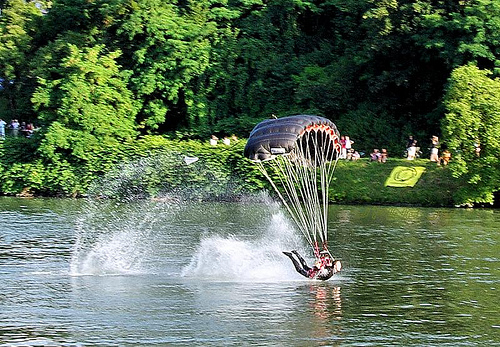

Real Caption is: ['the', 'parasailer', 'is', 'skipping', 'across', 'the', 'water']
Random Categorical Caption is: ['a', 'man', 'rides', 'a', 'man', 'sitting', 'on', 'a', 'body', 'of', 'water', 'on', 'a', 'river']
Greedy Caption is: ['a', 'man', 'is', 'standing', 'in', 'a', 'body', 'of', 'water', 'on', 'a', 'river', 'with', 'a', 'small', 'boat']
Top k=2 Sampling Caption is: ['a', 'man', 'in', 'a', 'boat', 'with', 'a', 'man', 'are', 'playing', 'near', 'a', 'river', 'with', 'a', 'body', 'of', 'water', 'on', 'a', 'river', 'with', 'two', 'small', 'boat', 'past', 'a', 'body', 'of', 'water', 'on', 'a', 'river', 'with', 'a', 'body', 'of', 'water']
Top k=3 Sampling Caption is: ['a', 'man', 'is', 'standing', 'on', 'a', 'body', 'of', 'water', 'in', 'a', 'boat']
Beam Search Caption with k=2 is: ['a', 'person', 'in', 'a', 'child', 'in', 'the', 'other', 'people', 'in', 'a', 'river', 'with', 'two', 'small', 'boat', 'in', 'the', 'water', 'by', 'the', 'river']
Sentence bleu score with Random.categorica

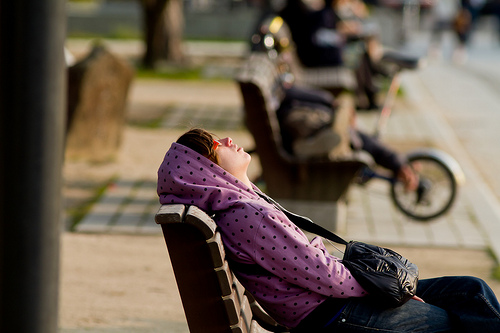

Real Caption is: ['a', 'young', 'lady', 'takes', 'time', 'to', 'think', 'on', 'a', 'public', 'bench']
Random Categorical Caption is: ['a', 'man', 'inside', 'a', 'police', 'van']
Greedy Caption is: ['a', 'man', 'in', 'a', 'purple', 'shirt', 'is', 'sitting', 'in', 'the', 'streets']
Top k=2 Sampling Caption is: ['man', 'sleeping', 'in', 'the', 'back']
Top k=3 Sampling Caption is: ['a', 'man', 'in', 'a', 'blue', 'hat', 'is', 'sitting', 'in', 'the', 'streets']
Beam Search Caption with k=2 is: ['a', 'dark', 'haired', 'person', 'is', 'laying', 'on', 'the', 'road']
Sentence bleu score with Random.categorical is: 0.029472997334359693
Sentence bleu score with Greedy Search is: 0.03331941928604962
Sentence bleu score with Top k=2 Sampling is: 0
Sentence bleu score with Top k=3 Sampling is: 0.03331941928604962
Sentence bleu score with Beam Search k=2 is: 0.03345364010799703



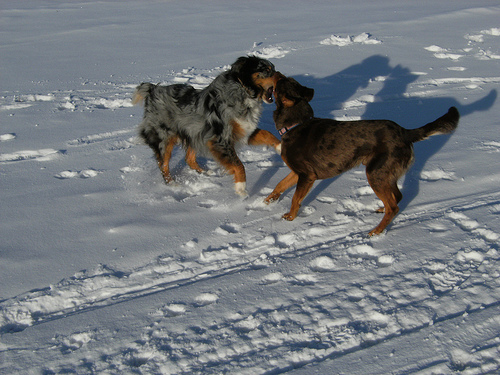

Real Caption is: ['a', 'brown', 'and', 'black', 'dog', 'are', 'fighting', 'on', 'snow']
Random Categorical Caption is: ['a', 'group', 'of', 'dogs', 'are', 'walking', 'a', 'snow', 'covered', 'mountain']
Greedy Caption is: ['a', 'black', 'dogs', 'are', 'walking', 'on', 'a', 'snow', 'covered', 'mountain']
Top k=2 Sampling Caption is: ['a', 'large', 'dogs', 'are', 'walking', 'on', 'a', 'snow', 'covered', 'mountain']
Top k=3 Sampling Caption is: ['a', 'black', 'dogs', 'walking', 'on', 'a', 'snow', 'covered', 'mountain']
Beam Search Caption with k=2 is: ['two', 'dogs', 'are', 'walking', 'stick', 'in', 'the', 'air']
Sentence bleu score with Random.categorical is: 0.043596130874773986
Sentence bleu score with Greedy Search is: 0.05347951345644844
Sentence bleu score with Top k=2 Sampling is: 0.0489129033564986
Sentence bleu score with Top k=3 Sampling is: 0.05512711483921727
Sentence bleu score with Beam Search k=2 is: 0.03201994137590339



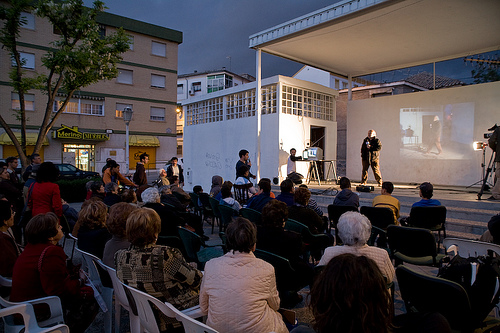

Real Caption is: ['a', 'lone', 'performer', 'or', 'lecturer', 'takes', 'the', 'stage', 'in', 'an', 'urban', 'setting', 'for', 'a', 'crowd', 'of', 'about', '30', 'spectators']
Random Categorical Caption is: ['a', 'group', 'of', 'men', 'in', 'a', 'bright', 'light', 'is', 'currently', 'in', 'a', 'red', 'room']
Greedy Caption is: ['a', 'group', 'of', 'people', 'are', 'giving', 'a', 'museum', 'of', 'a', 'lecture', 'hall', 'paying', 'attention', 'to', 'take', 'care', 'of', 'people']
Top k=2 Sampling Caption is: ['a', 'large', 'number', 'of', 'people']
Top k=3 Sampling Caption is: ['a', 'group', 'of', 'people', 'are', 'giving', 'a', 'meeting']
Beam Search Caption with k=2 is: ['a', 'group', 'of', 'individuals', 'and', 'many', 'different', 'countries']
Sentence bleu score with Random.categorical is: 0.023610712160855838
Sentence bleu score with Greedy Search is: 0.02169019854560574
Sentence bleu score with Top k=2 Sampling is: 0.0052318369323791705
Sentence bleu score with Top k=3 Sampling is:

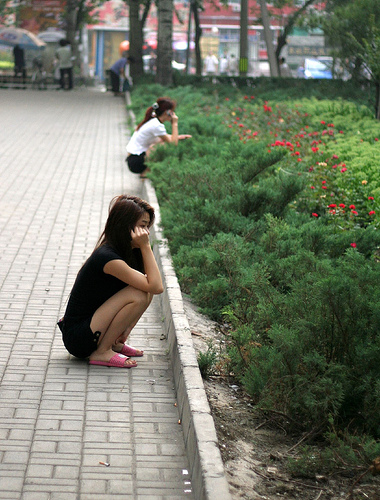

Real Caption is: ['two', 'girls', 'crouch', 'in', 'front', 'of', 'a', 'garden', 'of', 'small', 'shrubbery']
Random Categorical Caption is: ['a', 'beach', 'scene', 'looks', 'on', 'her', 'arm', 'up', 'something']
Greedy Caption is: ['a', 'man', 'is', 'walking', 'up', 'a', 'sidewalk']
Top k=2 Sampling Caption is: ['the', 'floor', 'full', 'their', 'arms', 'spread', 'in', 'the', 'street', 'from', 'a', 'lamp', 'post']
Top k=3 Sampling Caption is: ['a', 'person', 'with', 'a', 'hat', 'is', 'walking', 'on', 'a', 'sidewalk']
Beam Search Caption with k=2 is: ['a', 'person', 'is', 'standing', 'on', 'the', 'street', 'under', 'the', 'street', 'on', 'the', 'street', 'carrying', 'an', 'umbrella', 'as', 'she', 'looks', 'at', 'a', 'closed', 'off', 'of', 'the', 'street', 'on', 'the', 'street', 'carrying', 'an', 'umbrella', 'as', 'she', 'looks', 'at', 'a', 'closed', 'off', 'of', 'the', 'street', 'on', 'the', 'street', 'carrying', 'an', 'umbrella', 'as']
Sentence bleu score with Random.categorical is: 0.02

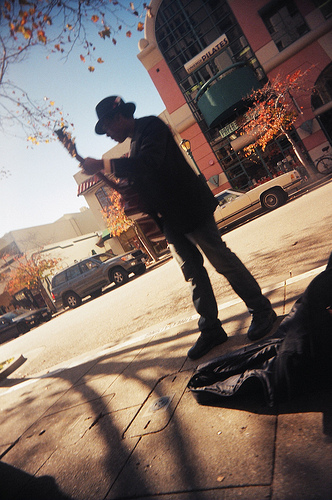

Real Caption is: ['a', 'man', 'dressed', 'in', 'dark', 'colors', 'and', 'a', 'hat', 'plays', 'his', 'guitar', 'on', 'the', 'side', 'of', 'the', 'road']
Random Categorical Caption is: ['a', 'man', 'is', 'walking', 'by']
Greedy Caption is: ['a', 'man', 'is', 'walking', 'down', 'a', 'street']
Top k=2 Sampling Caption is: ['man', 'in', 'a', 'sweater', 'walks', 'down', 'a', 'street']
Top k=3 Sampling Caption is: ['a', 'man', 'is', 'walking', 'down', 'a', 'city', 'street']
Beam Search Caption with k=2 is: ['a', 'person', 'in', 'a', 'but']
Sentence bleu score with Random.categorical is: 0.012750085458490486
Sentence bleu score with Greedy Search is: 0.027346462431506728
Sentence bleu score with Top k=2 Sampling is: 0.01809936077149441
Sentence bleu score with Top k=3 Sampling is: 0.0321875367468695
Sentence bleu score with Beam Search k=2 is: 0.007515356718077156



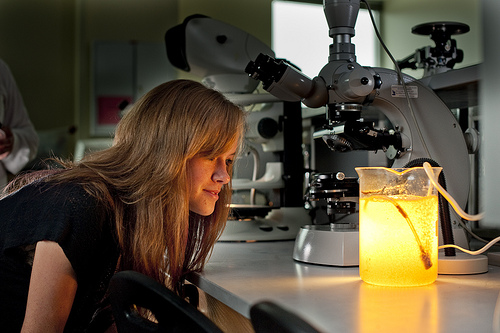

Real Caption is: ['young', 'woman', 'looking', 'at', 'a', 'glowing', 'beaker', 'in', 'a', 'lab']
Random Categorical Caption is: ['a', 'girl', 'wearing', 'glasses']
Greedy Caption is: ['a', 'man', 'is', 'looking', 'at', 'a', 'room']
Top k=2 Sampling Caption is: ['a', 'man', 'is', 'looking', 'happy', 'the', 'dogs', 'at', 'a', 'microscope']
Top k=3 Sampling Caption is: ['a', 'man', 'is', 'looking', 'through', 'microscope']
Beam Search Caption with k=2 is: ['man', 'is', 'looking', 'at', 'the', 'air']
Sentence bleu score with Random.categorical is: 0.02015542244226682
Sentence bleu score with Greedy Search is: 0.18772503655981246
Sentence bleu score with Top k=2 Sampling is: 0.09759407278293647
Sentence bleu score with Top k=3 Sampling is: 0.03481823229930724
Sentence bleu score with Beam Search k=2 is: 0.06947150678063999



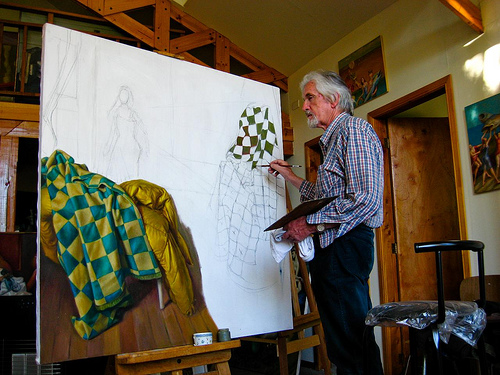

Real Caption is: ['a', 'man', 'wearing', 'a', 'plaid', 'shirt', 'is', 'painting', 'on', 'a', 'large', 'sheet']
Random Categorical Caption is: ['man', 'sitting', 'in', 'a', 'room', 'decorated', 'with', 'latex']
Greedy Caption is: ['a', 'man', 'leaning', 'against', 'a', 'bicycle', 'meter', 'works', 'in', 'a', 'room', 'decorated', 'with', 'butterflies']
Top k=2 Sampling Caption is: ['a', 'man', 'leaning', 'against', 'the', 'hand', 'loom']
Top k=3 Sampling Caption is: ['a', 'man', 'leaning', 'against', 'a', 'wood', "'", '<unk>']
Beam Search Caption with k=2 is: ['a', 'policeman', 'is', 'putting', 'up', 'some', 'type', 'shirt', 'cleaning', 'products', 'that', 'is', 'pulled', 'over']
Sentence bleu score with Random.categorical is: 0.029038360998903653
Sentence bleu score with Greedy Search is: 0.06733087507031198
Sentence bleu score with Top k=2 Sampling is: 0.05479198861078441
Sentence bleu score with Top k=3 Sampling is: 0.0681410158278438
Sentence bleu score with Beam Search k=2 is: 0.030

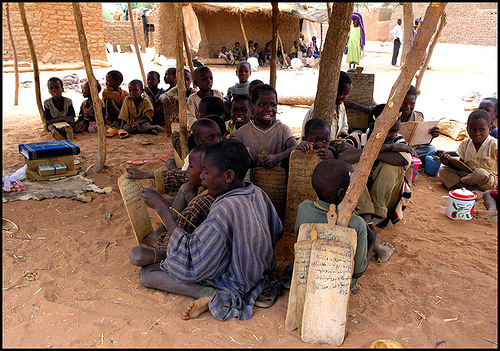

Real Caption is: ['english', 'class', 'with', 'the', 'boys']
Random Categorical Caption is: ['a', 'group', 'of', 'men', 'sit', 'in', 'the', 'sun']
Greedy Caption is: ['a', 'group', 'of', 'elderly', 'men', 'sit', 'on', 'a', 'group', 'of', 'people']
Top k=2 Sampling Caption is: ['a', 'group', 'of', 'elderly', 'men', 'sit', 'outside', 'on', 'a', 'lady', 'tournament', 'in', 'their', 'faces', 'while', 'two', 'adult', 'sit', 'in', 'the', 'background', 'observing', 'something']
Top k=3 Sampling Caption is: ['a', 'group', 'of', 'elderly', 'men', 'sit', 'on', 'a', 'group']
Beam Search Caption with k=2 is: ['people', 'sit', 'in', 'the', 'sun', 'while', 'something', 'to', 'an', 'outdoor', 'gathering', 'of', 'him']
Sentence bleu score with Random.categorical is: 0.036283347037395386
Sentence bleu score with Greedy Search is: 0
Sentence bleu score with Top k=2 Sampling is: 0.011429709774264874
Sentence bleu score with Top k=3 Sampling is: 0
Sentence bleu score with Beam Search k=2 is: 0.02100824377

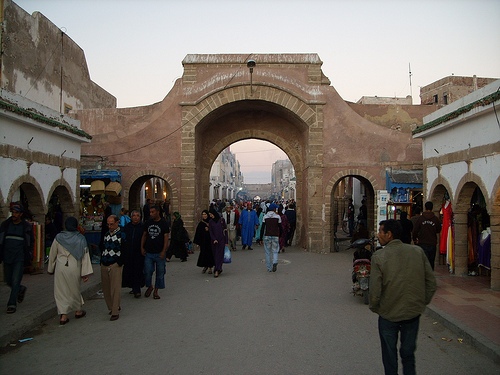

Real Caption is: ['men', 'women', 'and', 'children', 'walking', 'up', 'and', 'down', 'a', 'street']
Random Categorical Caption is: ['small', 'boy', 'and', 'small', 'children', 'walking', 'past', 'a', 'building', 'with', 'beautiful', 'artwork']
Greedy Caption is: ['a', 'group', 'of', 'african', 'americans', 'stand', 'in', 'front', 'of', 'a', 'building', 'with', 'a', 'walk']
Top k=2 Sampling Caption is: ['a', 'group', 'of', 'african', 'americans', 'are', 'walking', 'down', 'a', 'sidewalk']
Top k=3 Sampling Caption is: ['several', 'people', 'walking', 'down', 'a', 'sidewalk']
Beam Search Caption with k=2 is: ['several', 'asian', 'musicians', 'are', 'walking', 'through', 'desert']
Sentence bleu score with Random.categorical is: 0.07967268285693077
Sentence bleu score with Greedy Search is: 0.019381628383780852
Sentence bleu score with Top k=2 Sampling is: 0.0869857170128878
Sentence bleu score with Top k=3 Sampling is: 0.08170398178789133
Sentence bleu score with Beam Search k=2 is: 0.0276

In [ ]:
for i in range(20):
    j = random.randint(0, len(img_name_val)//3 - 1)
    display(Image.open(img_name_val[j]))
    # references_random are the same as every other reference
    print(f"Real Caption is: {references_random[j]}")
    print(f"Random Categorical Caption is: {hypothesis_random[j]}")
    print(f"Greedy Caption is: {hypothesis_greedy[j]}")
    print(f"Top k=2 Sampling Caption is: {hypothesis_top_k_two[j]}")
    print(f"Top k=3 Sampling Caption is: {hypothesis_top_k_three[j]}")
    print(f"Beam Search Caption with k=2 is: {hypothesis_beam_two[j]}")
    score_random = sentence_bleu([references_random[j]], hypothesis_random[j], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    score_greedy = sentence_bleu([references_random[j]], hypothesis_greedy[j], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    score_top_k_2 = sentence_bleu([references_random[j]], hypothesis_top_k_two[j], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    score_top_k_3 = sentence_bleu([references_random[j]], hypothesis_top_k_three[j], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    score_beam_k_2 = sentence_bleu([references_random[j]], hypothesis_beam_two[j], weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)
    print(f"Sentence bleu score with Random.categorical is: {score_random}")
    print(f"Sentence bleu score with Greedy Search is: {score_greedy}")
    print(f"Sentence bleu score with Top k=2 Sampling is: {score_top_k_2}")
    print(f"Sentence bleu score with Top k=3 Sampling is: {score_top_k_3}")
    print(f"Sentence bleu score with Beam Search k=2 is: {score_beam_k_2}\n")

## Παρατηρούμε το συχνό φαινόμενο όπου επαναλαμβάνονται οι λέξεις στα παραγόμενα captions. Πρόκειται για μια βελτίωση που πρέπει να συμπεριλάβουμε μελλοντικά στην αξιολόγηση του μοντέλου, δηλαδή να διακόπτουμε τις επαναλαμβανόμενες λέξεις. Παράλληλα παρατηρούμε πως οι αποδόσεις στις παραπάνω εικόνες είναι συνήθως κάτω από 0.1 κάτι το οποίο μας δείχνει πως το μοντέλο μας χρειάζεται αρκετές βελτιώσεις ακόμα. Ωστόσο από αυτές τις τυχαίες εικόνες παρατηρούμε πως κάποιες (λίγες) εικόνες πετυχαίνουν ένα πολύ καλό sentense_bleu score. Μάλιστα μία εικόνα πετυχαίνει score 0.49! Eπίσης και άλλες εικόνες αν και έχουν χαμηλό score αποδίδουν μια φυσική σημασία και ερμηνεία απλά το caption της εικόνας περιγράφει την εικόνα με άλλες παρόμοιες λέξεις.


## Aξιολόγηση του validation set με την **corpus_bleu**

In [ ]:
# Edit references to be a list of list of lists for corpus_bleu. hypothesis is a list of lists, so no editing required for hypothesis

references_random_edited = []
for i in range(len(references_random)):
    temp = [references_random[i]]
    references_random_edited.append(temp)


In [ ]:
corpus_bleu(references_random_edited, hypothesis_random, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)

0.03387332687943203

In [ ]:
corpus_bleu(references_random_edited, hypothesis_greedy, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)

0.038445390257919126

In [ ]:
corpus_bleu(references_random_edited, hypothesis_top_k_two, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)

0.04407627172097135

In [ ]:
corpus_bleu(references_random_edited, hypothesis_top_k_three, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)

0.04199748221437088

In [ ]:
corpus_bleu(references_random_edited, hypothesis_beam_two, weights=(0.4, 0.3, 0.2, 0.1), smoothing_function=SmoothingFunction().method1)

0.016584382390722623

## Παρατηρούμε πως με τον greedy_search αλγόριθμο πετυχαίνουμε ελάχιστα καλύτερο corpus_bleu score συγκριτικά με τον αλγόριθμο random.categorical. Ωστόσο με τον αλγόριθμο Top k=2 sampling πετυχαίνουμε ελάχιστα καλύτερα corpus_bleu score συγκριτικά με τους υπόλοιπους αλγόριθμους. Παρατηρούμε πως και στο corpus_bleu οι αποδόσεις μας παραμένουν πολύ χαμηλές. Το score βρίσκεται σταθερά κάτω από το 0.05 και αυτό μας δείχνει πως χρειάζονται ακόμα αρκετές βελτιώσεις του μοντέλου μας ...

In [ ]:
len(img_name_val)//3 - 1

3995

In [ ]:
len(set(img_name_val[:len(img_name_val)//3]))

2099

### Παρατηρούμε πως στο 1/3 του validation set έχουμε σχεδόν 4.000 εικόνες εκ των οποίων οι 2.000 είναι διαφορετικές. Οι άλλες 2.000 εικόνες δεν είναι μοναδικές, αυτό συνεπάγεται πως ένα λάθος σε μια εικόνα είναι πολύ πιθανό να μην συμφωνεί με κάνενα από τα διαθέσιμα captions και έτσι το λάθος ουσιαστικά μεταφέρεται σε όλες τις ίδιες εικόνες. Όπως και να έχει οφείλουμε μελλοντικά να βελτιώσουμε και άλλο το μοντέλο μας.

# **Συμπεράσματα**

### To τελικό μας μοντέλο αποτελείται από τις παρακάτω παραμέτρους:
*  Αντί του InceptionV3 έχουμε κάνει χρήση του **Xception**
*  Επιλέχθηκαν τυχαίες 12.000 εικόνες από το dataset για training (9.600) και validation (2.400), σκοπό τη μείωση του χρόνου εκπαίδευσης ανά εποχή
*  Έχουμε κρατήσει captions με **4 <= μήκος <= 49**
*  Έγινε χρήση λεξικού **10.000** λέξεων αντί 5.000 λέξεων.
*  Χρησιμοποιήσαμε έτοιμα embeddings (**glove.6B.100d**) με μεταφορά μάθησης κάτι που μείωσε το πλήθος των βαρών προς εκπαίδευση
*  Έγινε χρήση επιπέδου Dropout(0.25) μετά τις μονάδες GRU στο decoder
*  Υλοποιήθηκαν συγκεκριμένοι αλγόριθμοι για την αξιολόγηση της ποιότητας του παραγόμενου captioning

## Το μοντέλο στο παρών notebook έχει εκπαιδευτεί ήδη 40 εποχές όταν φορτώνουμε τα weights. Στο τελικό commit του notebook εκπαιδεύτηκε για άλλες 10 εποχές. Συνολικά μετά από **50 εποχές** πετυχαίνουμε το training loss να πέσει κάτω από 0.36.

### Το αρχικό μας μοντέλο το οποίο δεν είναι υλοποιημένο στο παρών notebook είχε ελαφρώς διαφορετικές παραμέτρους από αυτές που έχουμε παρουσιάσει εδώ. Είχαμε θέσει στα captions  μήκη μεταξύ 4-39, μέγεθος λεξιλόγιου 6000 και είχαμε θέσει 1 dropout επίπεδο μετά τις μονάδες GRU με dropout_rate=0.5. Τα υπόλοιπα μεγέθη ήταν ίδια με αυτά που έχουμε θέσει στο παρών notebook. Ωστόσο παρατηρήθηκε πως μετά από 40 εποχές εκπαίδευσης το training loss δε μπορούσε να μειωθεί κάτω από 0.55 και αυτό διότι από τις πρώτες 2 εποχές είχε αυξημένο training loss συγκριτικά με το τελικό μας μοντέλο.
### Oπότε χρειάστηκε να αλλάξουμε αρκετές παραμέτρους ώστε να πετύχουμε καλύτερες επιδόσεις. Αυτό το καταφέραμε αξιολογώντας κάθε φορά το training loss που πετυχαίναμε μετά από 2 εποχές. Συγκεκριμένα αν μετά από 2 εποχές το training loss δεν είχε πέσει κάτω από 0.95 τότε ακυρώναμε την προσπάθεια και αναζητούσαμε άλλες επιλογές. 
### Έγιναν αρκετές επιλογές τόσο σε περιβάλλον kaggle όσο και σε περιβάλλον google colab ώστε να μοιραστούν οι πόροι. Έγιναν αρκετές βελτιστοποιήσεις ώστε στο περιβάλλον kaggle που τρέχαμε πολλές εποχές εκπαίδευσης να μειωθεί ο χώρος στο working output και αυτό το καταφέραμε εισάγωντας τα δεδομένα ως dataset. Παράλληλα δοκιμάσαμε διάφορα embeddings dimensions και καταλλήξαμε πως με το glove.6B.100d πετυχαίναμε πάντα καλύτερες επιδόσεις συγκριτικά με άλλες επιλογές. Επίσης για εξοικονόμηση των πόρων GPU έγινε αποθήκευση των weights του μοντέλου ώστε η εκπαίδευση κάθε φορά να συνεχίζεται από το σημείο που είχε μείνει την τελευταία φορά.
### *Ως προς τον όγκο των δεδομένων εκπαίδευσης* παρατηρήθηκε πως με αύξηση των εικόνων εκπαίδευσης από 12.000 σε 20.000 δεν είχαμε βελτίωση της εκπαίδευσης αλλά αντιθέτως είχαμε αύξηση του χρόνου εκπαίδευσης από 220 sec σε 400+sec ανα εποχή. Συνεπώς καταλήξαμε στην επιλογή 12.000 εικόνων (9.600 εικόνες για εκπαίδευση και 2.400 εικόνες για validation).
### *Ως προς το μέγεθος του λεξιλόγιου* παρατηρήσαμε πως με αύξηση του από 6.000(που είχε το αρχικό μοντέλο) σε 10.000 είχαμε πιο πλούσιες προτάσεις και ελάχιστη αύξηση του χρόνου εκπαίδευσης.
### *Ως προς το μέγεθος των captions* παρατηρήσαμε πως με αύξηση του μέγιστου μήκους από 39 (που είχε το αρχικό μοντέλο) σε 49 πετύχαμε καλύτερο training loss στη δεύτερη εποχή κοντά στο 0.93 ενώ το αρχικό μας μοντέλο είχε training loss κοντά στο 1.08 ενώ η διάρκεια εκπαίδευσης ανά εποχή αυξήθηκε ελάχιστα από 200 sec σε 220-240 sec.
### *Ως προς τον decoder* σε όλες τις προσπάθειες μας κάναμε χρήση έτοιμων embeddings. Ωστόσο δοκιμάσαμε να αυξήσουμε τις μονάδες GRU από 512 σε 724 και σε 1012 χωρίς όμως βελτίωση της επίδοσης σε 2 εποχές εκπαίδευσης. Όταν δοκιμάσαμε LSTM αντί για GRU πάλι δεν είχαμε βελτιωση της επίδοσης. Δοκιμάστηκαν επίσης και δύο επίπεδα GRU στα οποία αυξήθηκε ο χρόνος εκπαίδευσης αλλά δε βελτιώθηκε η επίδοση μετά από 2 εποχές εκπαίδευσης.


### Ως προς το evaluation υλοποιήθηκαν: PURE SAMPLING DECODER(random.categorical), GREEDY DECODER, TOP-K SAMPLING DECODER(k=2, 3), BEAM SEARCH DECODER. 

## Aς πούμε δυο λόγια όμως για τους παραπάνω αλγόριθμους. 

### Ο **καθαρός αποκωδικοποιητής δειγματοληψίας (PURE SAMPLING DECODER)** είναι πολύ παρόμοιος με τον αποκωδικοποιητή άπληστης αναζήτησης, αλλά αντί να επιλέγουμε τη λέξη με την υψηλότερη πιθανότητα, δειγματίζουμε τυχαία τη λέξη από την κατανομή πιθανοτήτων ολόκληρου του λεξιλογίου. Οι μέθοδοι δειγματοληψίας, όπως η καθαρή δειγματοληψία και η δειγματοληψία Top-K (παρακάτω) παρέχουν καλύτερη ποικιλομορφία και γενικά θεωρούνται καλύτερες στη δημιουργία φυσικής γλώσσας.

### O **TOP-K SAMPLING DECODER** είναι παρόμοιoς με τον αποκωδικοποιητή δειγματοληψίας PURE SAMPLING DECODER, αλλά αντί να χρησιμοποιούμε ολόκληρη την κατανομή πιθανοτήτων, δειγματίζουμε μόνο από top-k πιθανές λέξεις. Αν χρησιμοποιήσουμε k=1, είναι το ίδιο με την άπληστη αναζήτηση και αν χρησιμοποιήσουμε το συνολικό μήκος του λεξιλογίου ως k, τότε λειτουργεί ως καθαρός αποκωδικοποιητής δειγματοληψίας. Με αυτόν τον αποκωδικοποιητή πετυχαίνουμε το καλύτερο bleu_score.

### O **GREEDY DECODER** είναι η πιο απλή προσέγγιση όπου επιλέγουμε τη λέξη που έχει τη μεγαλύτερη πιθανότητα (δηλαδή να ενεργούμε άπληστα). Και ενώ θα μπορούσε να δημιουργήσει την ακολουθία των λέξεων, η ποιότητα της εξόδου είναι συχνά χαμηλή σε σύγκριση με τους άλλους αλγόριθμους αποκωδικοποίησης.

### Ο **BEAM SEARCH DECODER** επιλέγει τις καλύτερες ακολουθίες «Ν» μέχρι στιγμής και εξετάζει τις πιθανότητες του συνδυασμού όλων των προηγούμενων λέξεων μαζί με τη λέξη στην τρέχουσα θέση. Ωστόσο η υλοποίηση μας δυστυχώς πραγματοποιεί κάτι διαφορετικό. Έστω πως η προτεινόμενη λέξη ξεκινάει είτε με 'a' είτε με 'people'. Τότε στην επόμενη περίπτωση θα επιλέξει δυο πιθανές δεύτερες λέξεις ως εκείνες τις λέξεις που θα έχουν μεγαλύτερη πιθανότητα να συμβούν είτε με το 'a' είτε με 'people'. 
####Έστω λοιπόν οι δύο λέξεις από το 'a' είναι το 'group' και το 'person' και οι δύο επόμενες λέξεις από το 'people' είναι το 'are' και το 'will'. Τα δυο μονοπάτια προς εξερεύνηση πλέον θα είναι τα ('a' and ('group' or 'person')) και ('people' and ('are' or 'will')). Σύμφωνα με τον αλγόριθμο που παρουσιάζεται στο towardsdatascience (https://towardsdatascience.com/foundations-of-nlp-explained-visually-beam-search-how-it-works-1586b9849a24) όποιο μονοπάτι διαλέξουμε τότε η τρίτη πιθανή λέξη θα είναι το αποτέλεσμα αν έχουμε δώσει στο decoder την ακολουθία για παράδειγμα 'a', 'person'. H δική μας υλοποίηση ουσιαστικά διαλέγει βάση πιθανοτήτων το αντίστοιχο μονοπάτι αλλά κάθε φορά στο decoder δίνεται ως είσοδος ένα διάνυσμα που περιέχει τη τελευταία λέξη κάθε φορά της ακολουθίας και όχι όλη την ακολουθία ως στιγμής. Υλοποιούμε δηλαδή μιας μορφής top2 greedy search αλλά βάση πιθανοτήτων που προκύπτουν από τη γνώση των προηγούμενων επιλογών. Αυτό διότι ο RNN Decoder έτσι όπως έχει οριστεί στο μοντέλο μας δέχεται κάθε φορά ως είσοδο μία λέξη και βάση αυτής προβλέπει την επόμενη ενώ δε μπορεί να δεχτεί ακολουθία λέξεων ...


## **Μελλοντικές Βελτιώσεις**

* Εξαγωγή των χαρακτηριστικών και εισαγωγή ως dataset ώστε να επιταχύνουμε την εκτέλεση του notebook.
* Εύρεση νέων παραμέτρων του μοντέλου μας που μπορούν να πετύχουν καλύτερο training loss από το παρών μετά από 50 εποχές με απώτερο σκοπό βελτίωση του corpus_blue το οποίο στις δοκιμές μας ως στιγμής δεν έχει ξεπεράσει το 0.6 στο validation set. Εν μέρη αυτό οφείλεται στο γεγονός ότι το validation set αποτελείται από αρκετές εικόνες οι οποίες υπάρχουν 5 φορές με 5 διαφορετικά captions. Οπότε αν αστοχήσει το caption σε μια εικόνα τότε θα έχει αστοχήσει ουσιαστικά σε 5 εικόνες. Αυτός είναι και ο λόγος όπου στον αντίστοιχο διαγωνισμό πετυχαίνουμε score κοντά στο 0.2 καθώς οι εικόνες εκεί είναι μοναδικές και το εκάστοτε λάθος δεν πολλαπλασιάζεται επί 5. Βέβαια ένας ακόμα λόγος είναι πως στο διαγωνισμό λαμβάνουμε λίγο μεγαλύτερες τιμές corpus_bleu σε σχέση με αυτό του validation set είναι λόγω ασυμβατότητας της version της Python του Codalab με τους τελευταίους ορισμούς στην nltk.translate.bleu_score
* Eκτίμηση του corpus_bleu score σε όλο το validation set και όχι στο 1/3 του validation set. 
* Yλοποίηση της συνάρτηση beam_seach(image, k) με αντικειμενοστρεφή τρόπο και έλεγχος της επίδοσης της. 
* Eπίσης βελτίωση της υλοποίησης στις συναρτήσεις πρόβλεψεις των caption ώστε να αποφεύγονται οι επαναλήψεις διαδοχικών λέξεων μέχρι να φτάσουμε στο max_length.

# **Competition**

## Παρακάτω εκτελούμε τη συνάρτηση **get_caption_competition** η οποία μας επιστρέφει τα predicted captions στα test_images ώστε να συμμετέχουμε στο διαγωνισμό: ECE Image Captioning Competition https://codalab.lisn.upsaclay.fr/competitions/926#results

In [ ]:
def get_caption_competition(test_images):
    predicted_captions = []
    for ii in range(len(test_images)):
        rid = ii
        image = test_images[rid]
        # Here we choose top_2_random_sampling for our entry in the competition
        result = top_k_sampling_evaluate_while_training(image, 2)
        #result = simple_random_categorical_evaluate_while_training(image)
        #result = greedy_evaluate_while_training(image)
        #result = beam_search_evaluate_width_two(image, 2)
        # remove end from final predicted caption
        if result[-1] == "<end>":
            predicted_captions.append(result[:len(result) - 1])
        else:
            predicted_captions.append(result)
    return predicted_captions

In [ ]:
test_hypotheses = get_caption_competition(test_images)

In [ ]:
unk = 0
for i in range(len(test_hypotheses)):
    for j in range(len(test_hypotheses[i])):
        if test_hypotheses[i][j] == '<unk>':
            unk += 1
print(f"Unknown words in our random top_2 predictions test captions are: {unk} ")

Unknown words in our random top_2 predictions test captions are: 57 


In [ ]:
# length is 2.000 since we have 2.000 test images

len(test_hypotheses)

2000

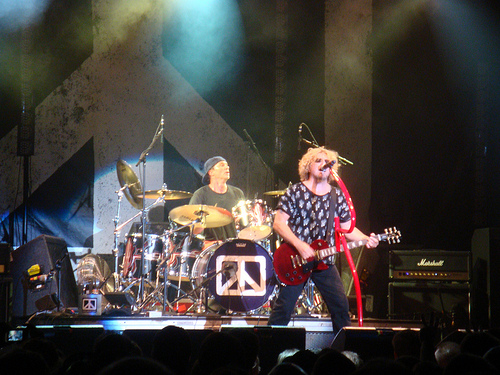

In [ ]:
Image.open(test_images[1400])

In [ ]:
test_hypotheses[1400]

['a', 'man', 'playing', 'on', 'stage', 'playing', 'band', 'performing']

In [ ]:
# Finally obtain the file and afterwards upload it in the competition

import json 


jsonString = json.dumps(test_hypotheses)
jsonFile = open("test_hypotheses.json", "w")
jsonFile.write(jsonString)
jsonFile.close()

## Aν και στο validation set δε πετυχαίνουμε καλά αποτελέσματα στο διαγωνισμό καταφέραμε να πετύχουμε ένα score στο **0.20**. Η συμμετοχή μας στο διαγωνισμό πραγματοποιήθηκε με το ψευδώνυμο: **zombarxos** εκ μέρους της **ομάδας 38**. Υπενθυμίζουμε ωστόσο πως τα υπόλοιπα μέλη της ομάδας δε συμμετείχαν καθόλου στην περάτωση του συγκεκριμένου notebook. Το τελικό αποτέλεσμα της συμμετοχής μας έφτασε στο 0.24 ύστερα από τροποποιήσεις που δεν πραγματοποιούνται στο παρών notebook.